# Apparel recommendation

# Objective
            To apply weighted IDF vectorizer using text,brand,color and image feature

### Importing necessary packages

In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

### Summary
        Importing all the necessary packages to perform computation

### Reading data

In [2]:
# we have give a json file which consists of all information about
# the products
# loading the data using pandas' read_json file.
data =pd.read_json('tops_fashion.json')

In [3]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [4]:
data = data[['asin','brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [5]:
data.columns

Index(['asin', 'brand', 'color', 'medium_image_url', 'product_type_name',
       'title', 'formatted_price'],
      dtype='object')

In [6]:
 print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### Summary
            1. Reading data from the database.
            2. Selecting only 7 columns from the data

### Basic statistics

###  Basic stats for the feature: product_type_name

In [7]:
print(data['product_type_name'].describe())

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [8]:
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [9]:
product_type_count=Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

### Summary
        1. Only 72 product types are there, most of the product types are repeated.
        2. This feature mostly consist of 'SHIRT'

### Basic statistics for feature : brand

In [10]:
print(data['brand'].describe())

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [11]:
brand_count=Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

### Summary
            1. There are lots of brands in the dataset
            2. Top brand is Zago, which is repeated 223 times

### Basic statistics for feature : color

In [12]:
print(data['color'].describe())

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [13]:
color_count=Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

### Summary
            Most of the products in the dataset has no brand feature

### Basic statistics for feature : formatted_price

In [14]:
print(data['formatted_price'].describe())

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [15]:
price_count=Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

### Summary
            Most of the products in the dataset has no price .

### Basic statistics for feature : Title

In [16]:
print(data['title'].describe())

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


### Removing data points with price having null value

In [17]:
data=data.loc[~data['formatted_price'].isnull()]
print('Data remained after removing datapoints with null price :',data.shape[0])

Data remained after removing datapoints with null price : 28395


### Removing data points with color having null value

In [18]:
data=data.loc[~data['color'].isnull()]
print('Data remained after removing datapoints with null price :',data.shape[0])

Data remained after removing datapoints with null price : 28385


In [19]:
data.to_pickle('pickels/28k_apparel_data')

### Removing near duplicate items

In [20]:
data=pd.read_pickle('pickels/28k_apparel_data')
print(sum(data.duplicated('title')))

2325


In [21]:
data.head(2)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99


### Removing datapoints with short titles

In [22]:
data_sorted=data[data['title'].apply(lambda x : (len(x.split())>4)) ]
print('Data left after removing short titles :',data_sorted.shape[0])

Data left after removing short titles : 27949


### Sorting data based on alphabetic order of titles

In [23]:
data_sorted.sort_values('title', inplace=True, ascending=False)
data_sorted.head(2)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19


In [24]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [25]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [26]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [27]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [28]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [29]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [30]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16435


In [31]:
data.to_pickle('pickels/16k_apperal_data')

### Summary
            All the data preprocessing has been done, now we have clean data

### Text precprocessing

In [32]:
data = pd.read_pickle('pickels/16k_apperal_data')

In [33]:
data.shape

(16435, 7)

In [34]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'doesn', 'about', 'over', 'am', 'herself', 'before', "hasn't", 'what', 'having', "you'll", "that'll", "don't", 'o', 'most', "you'd", 'because', 'against', "haven't", "isn't", 'yours', 'was', 'll', 'her', 'our', 'from', 'shan', 'whom', 'both', 'of', 'such', 'haven', "wouldn't", 'above', 'to', 'did', 't', 'and', 'the', 'them', 'under', 'm', 'hers', 'shouldn', "wasn't", 'have', 'itself', 'don', 'between', 'off', 'hasn', "couldn't", 'wouldn', 'while', 'these', 'than', "aren't", 'who', 'each', 'but', 'just', 're', 'until', "didn't", 'own', 'your', 'be', 'so', 'his', "should've", 'through', 'same', "needn't", 'how', 'all', 'do', 'i', 'she', 'any', "it's", 'very', 'been', 'if', "you're", "weren't", 'down', 'once', 'they', 'mustn', 'with', 'weren', 'its', 've', 'didn', 'again', "mustn't", 'we', 'ain', 'is', "you've", 'too', 'aren', 'there', 'other', 'at', 'in', "hadn't", "she's", 'myself', 'does', 'y', 'no', 'now', 'had', 'ma', 'only', 'you', 'doing', 'or', 'a', 'couldn', 

In [35]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

12.702925924310344 seconds


In [36]:
data.shape

(16435, 7)

In [37]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


### Summary
            Stop words has been removed from the title feature.

### Loading image features

In [38]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

Using TensorFlow backend.


In [39]:
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

In [40]:
len(asins)

16042

In [41]:
bottleneck_features_train.shape

(16042, 25088)

In [42]:
bottleneck_features_train[:2]

array([[0.11759627, 0.        , 0.        , ..., 0.        , 0.67754525,
        0.        ],
       [0.06240697, 0.        , 0.        , ..., 0.        , 0.6599147 ,
        0.        ]], dtype=float32)

### Summary
            1. Image data has loaded
            2. Only 16042 images features are there

In [43]:
data.shape

(16435, 7)

In [44]:
new_data = pd.DataFrame(columns=['asin','brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price'])


In [45]:
data.head(1)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26


In [46]:
len(data)

16435

In [47]:
img_feat=[]
for i in range(len(asins)):
    for j in  data['asin']:
        if(asins[i]==j):
            new_data=new_data.append(data.loc[data['asin'] == asins[i]])
            img_feat.append(bottleneck_features_train[i])
            break

### Summary
            Only 16042 image features are there and 16435 datapoints are there. So, we consider only the data points which has image feature.

In [48]:
len(img_feat)

16035

In [49]:
new_data.shape

(16035, 7)

In [50]:
new_data.head(2)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
110006,0000000060,Jofit,White,https://images-na.ssl-images-amazon.com/images...,BUILDING_MATERIAL,jofit womens jo tech polo white extra large,$25.99
77667,6042589113,Dress on Trend,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,dress trend womens lion chain print baggy over...,$16.00


In [51]:
img_feat= np.array(img_feat)
img_feat.shape

(16035, 25088)

### Summary
        Obtained new data which has all the datapoints which had image data 

### IDF vectorizer

In [52]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(new_data['title'])

In [53]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in new_data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(new_data.shape[0] / (n_containing(word)))

In [54]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

### Loading Word vectors of words 

In [55]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [56]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [57]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

In [58]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in new_data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


In [59]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in new_data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

### Onehot encoding of brand and color feature

In [60]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
new_data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in new_data['brand'].values]
types = [x.replace(" ", "-") for x in new_data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in new_data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [61]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [62]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

### Test case- 1 (with equal weights)

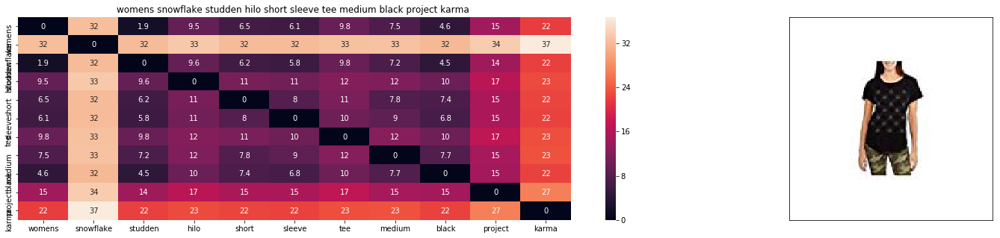

ASIN : B07229CT5D
Brand : Project Karma
euclidean distance from input : 0.0


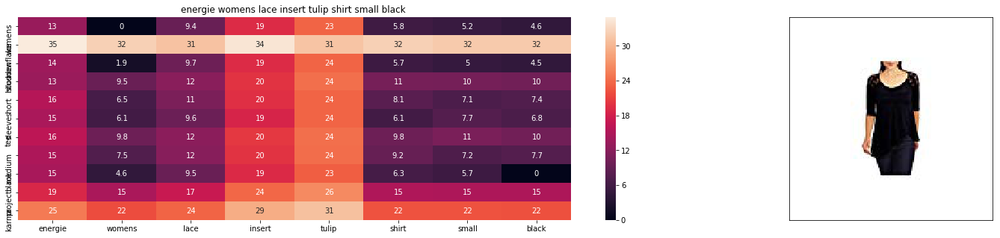

ASIN : B01F2UDNSI
Brand : Energie
euclidean distance from input : 11.941061054101734


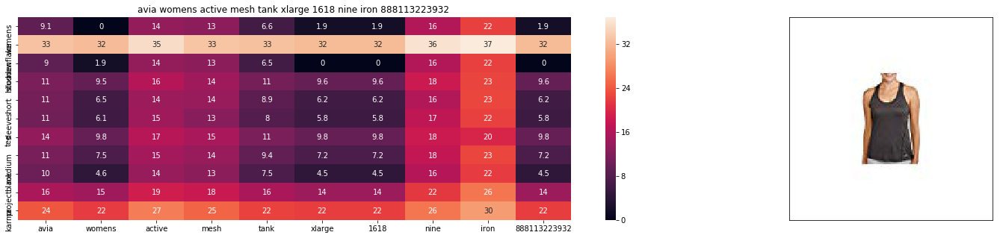

ASIN : B01F2UDTT6
Brand : Avia
euclidean distance from input : 12.205209477742512


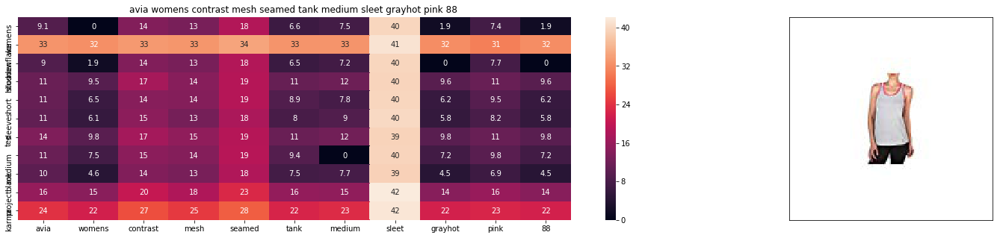

ASIN : B01F2UE4MM
Brand : Avia
euclidean distance from input : 12.224064676523483


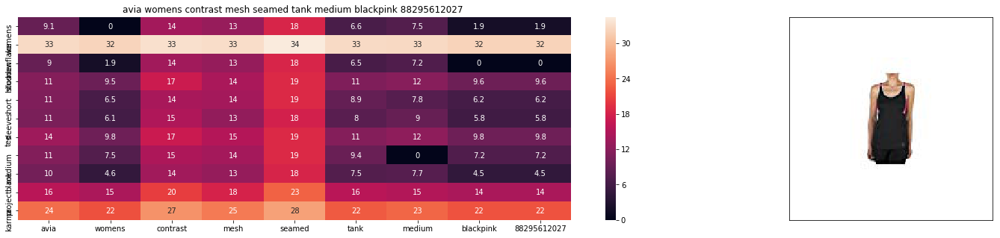

ASIN : B01F2UE6E8
Brand : Avia
euclidean distance from input : 12.261138407389323


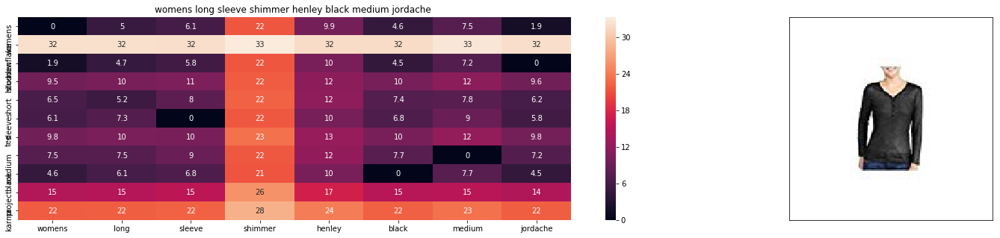

ASIN : B071YDYSLN
Brand : Jordache
euclidean distance from input : 12.501157921980967


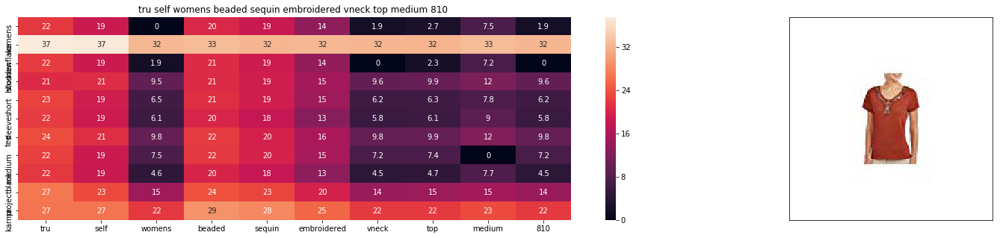

ASIN : B01F2UE9SQ
Brand : Tru Self
euclidean distance from input : 12.507223296722051


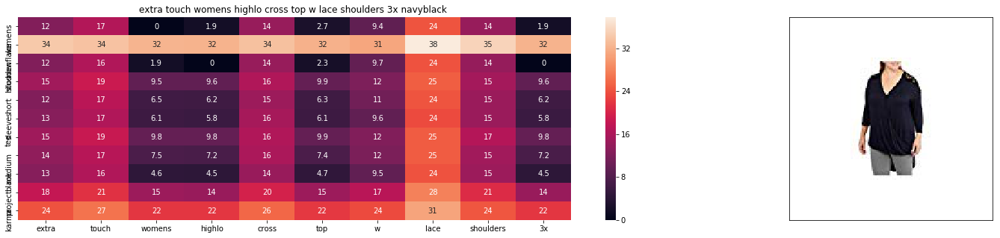

ASIN : B06XRX4MJK
Brand : Extra Touch
euclidean distance from input : 12.960713073595308


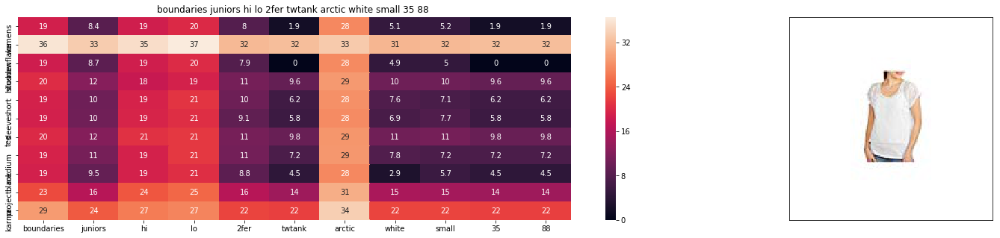

ASIN : B01EZB1PDK
Brand : No Boundaries
euclidean distance from input : 12.962648813486373


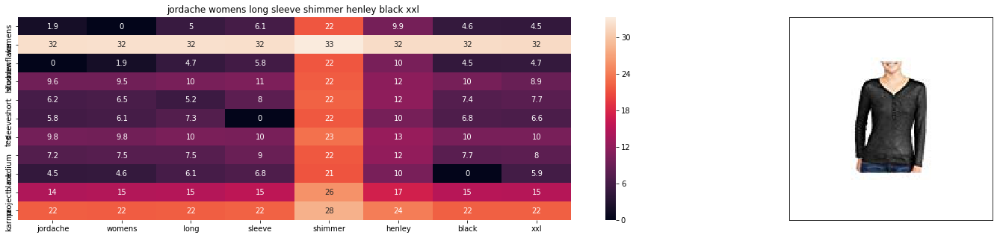

ASIN : B01MTV782F
Brand : Jordache
euclidean distance from input : 13.05053727073585


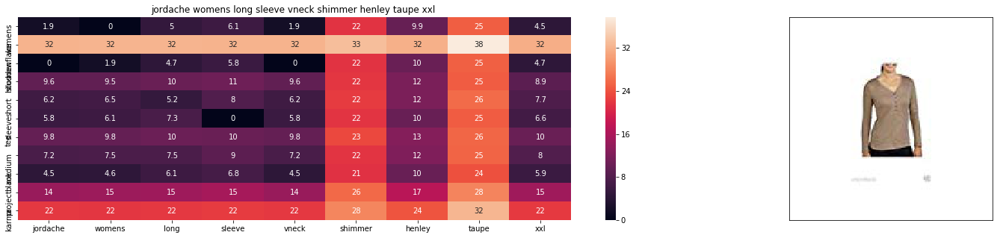

ASIN : B06ZXXN3BW
Brand : Jordache
euclidean distance from input : 13.132644912584565


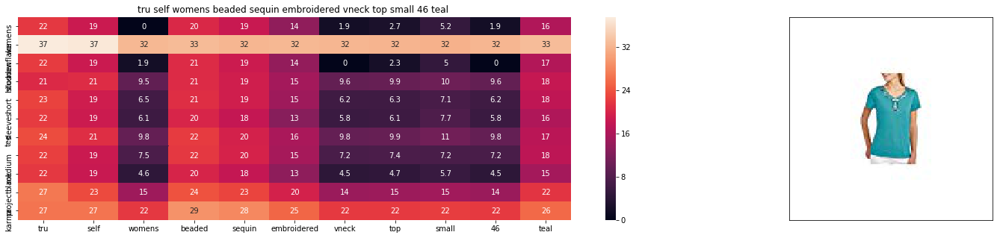

ASIN : B01F2UE4DG
Brand : Tru Self
euclidean distance from input : 13.15712678488123


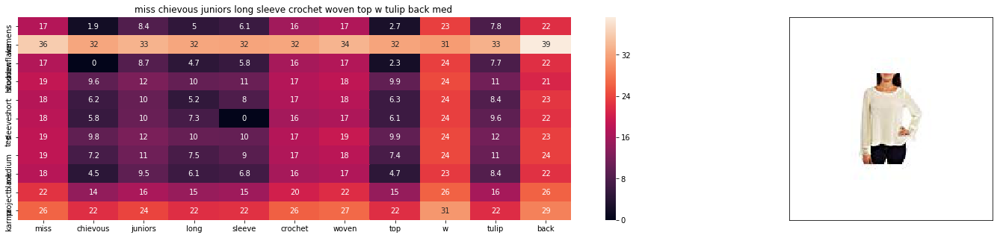

ASIN : B01GUJDLYG
Brand : Miss Chievous
euclidean distance from input : 13.20532193391438


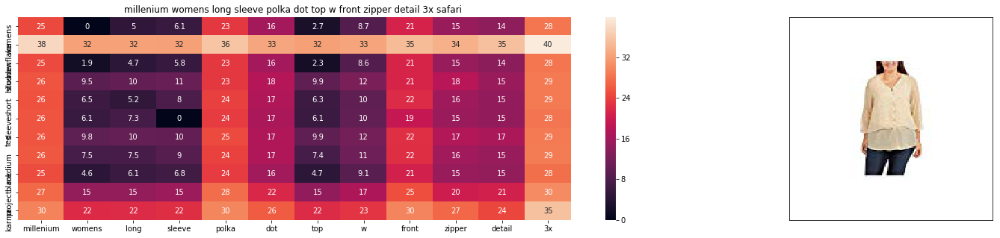

ASIN : B06XYLW7K3
Brand : Millenium
euclidean distance from input : 13.219697575751884


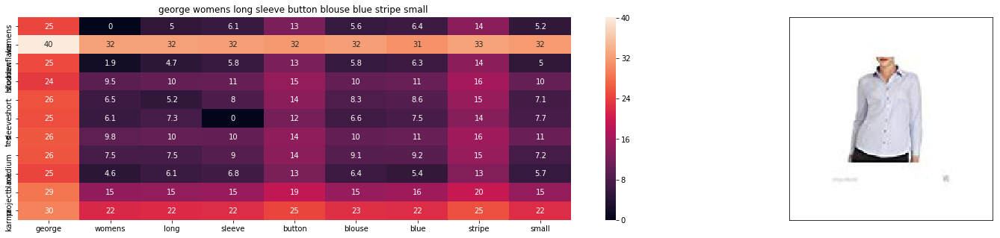

ASIN : B06ZXS39SJ
Brand : George
euclidean distance from input : 13.228662413447259


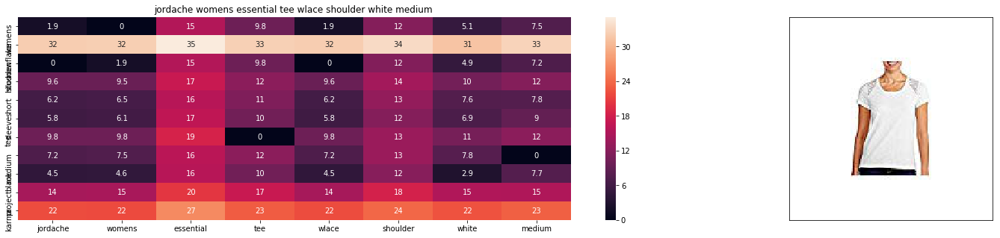

ASIN : B01KFMCUKK
Brand : Jordache
euclidean distance from input : 13.29868876634433


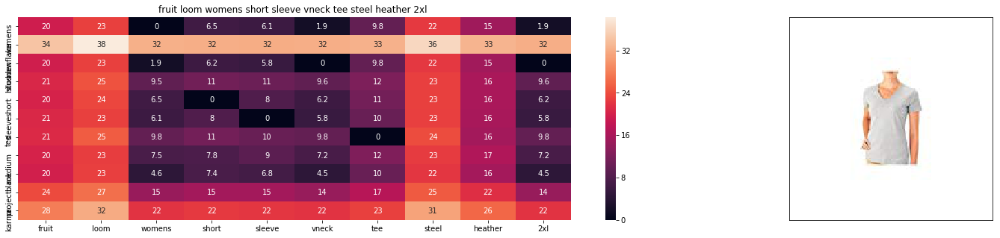

ASIN : B01EW91YA4
Brand : Fruit of the Loom
euclidean distance from input : 13.367234547932943


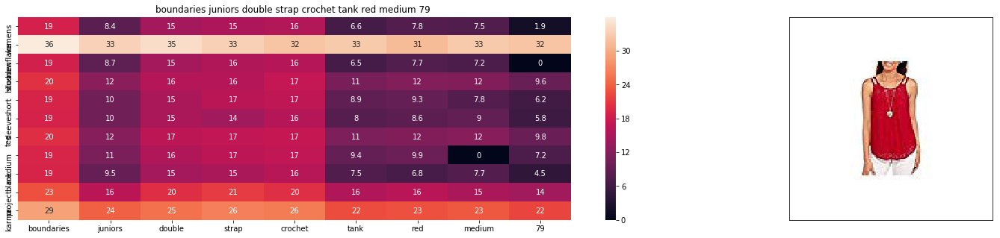

ASIN : B01KFMD53G
Brand : No Boundaries
euclidean distance from input : 13.379857176630852


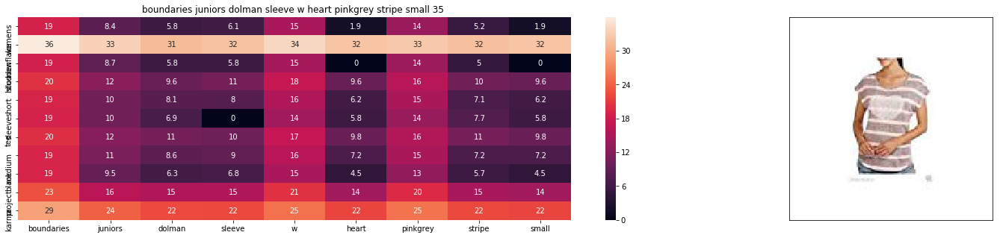

ASIN : B06ZZBBQKC
Brand : No Boundaries
euclidean distance from input : 13.56010704064619


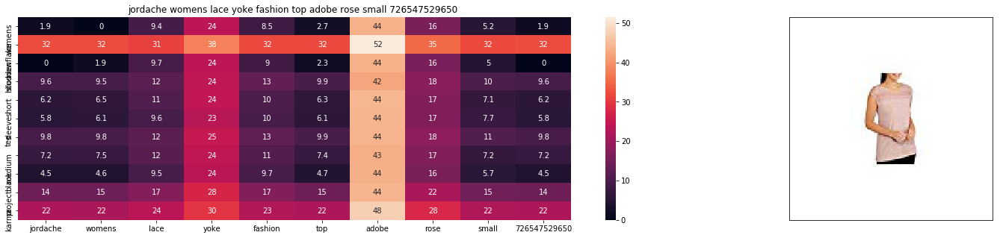

ASIN : B01F6MBUZK
Brand : Jordache
euclidean distance from input : 13.626746926793611


In [63]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5,5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 2 (with weights 10,5,5)

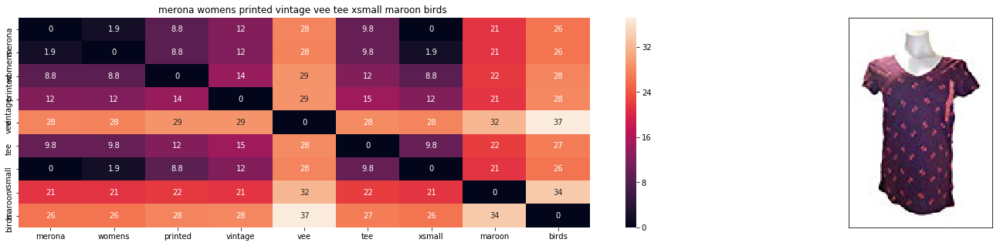

ASIN : B071VCMGYD
Brand : Merona
euclidean distance from input : 0.0


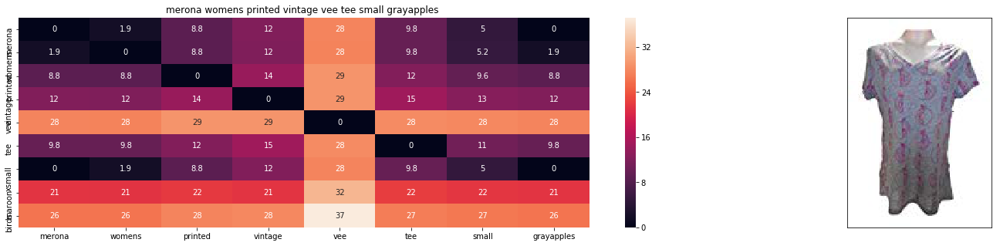

ASIN : B06Y43WWBD
Brand : Merona
euclidean distance from input : 11.315511322021484


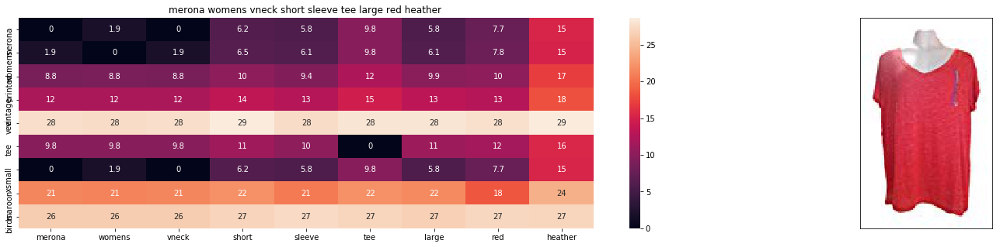

ASIN : B06ZZMR8LX
Brand : Merona
euclidean distance from input : 12.366550827026368


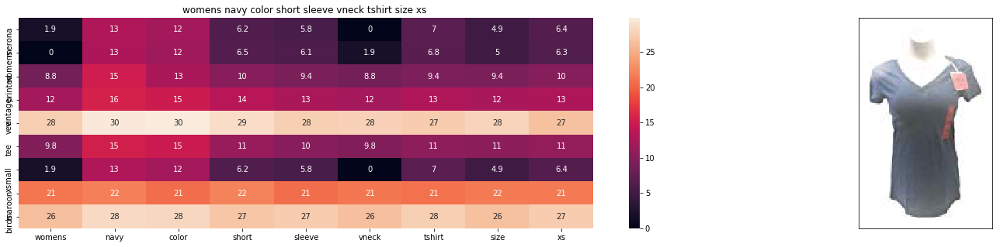

ASIN : B072BPJTNN
Brand : Mossimo
euclidean distance from input : 12.451361659902291


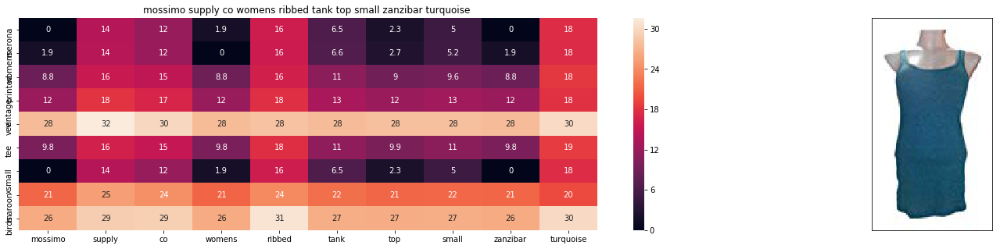

ASIN : B0713QLJRV
Brand : Mossimo
euclidean distance from input : 12.605685080654291


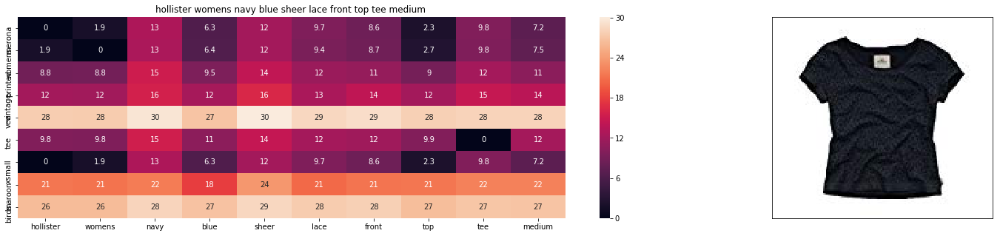

ASIN : B0719VM9CG
Brand : Hollister
euclidean distance from input : 12.634966091054634


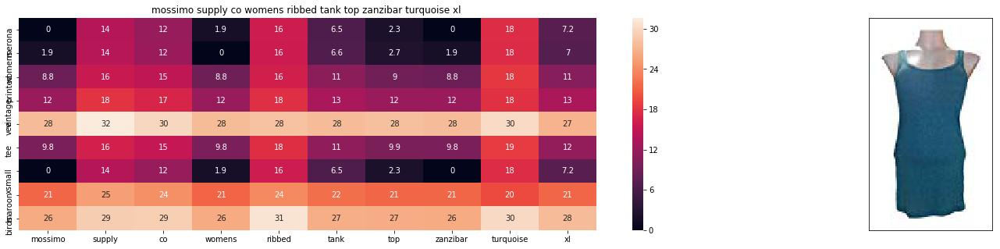

ASIN : B072FMV3KZ
Brand : Mossimo Supply Co
euclidean distance from input : 12.65910704773685


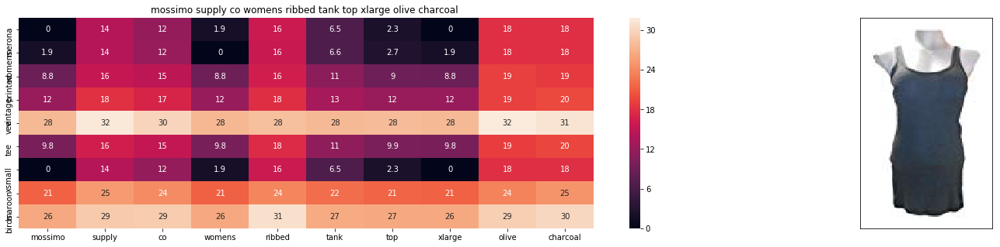

ASIN : B072P5XQCK
Brand : Mossimo
euclidean distance from input : 12.716420783168939


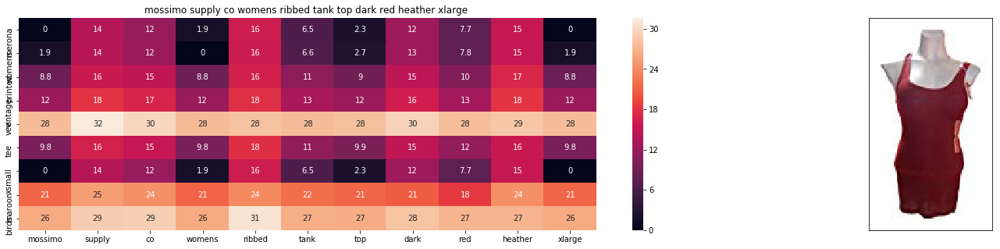

ASIN : B07174G5N5
Brand : Mossimo Supply Co
euclidean distance from input : 12.725720787229028


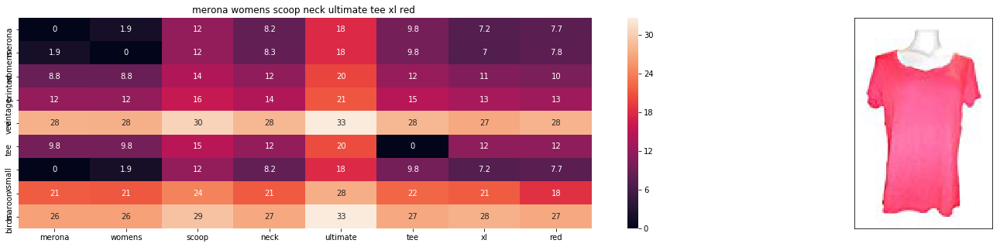

ASIN : B071XT9FPH
Brand : Merona
euclidean distance from input : 12.80401127519544


In [64]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12225, 10, 5,5, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 3 (with weights 10,5,5)

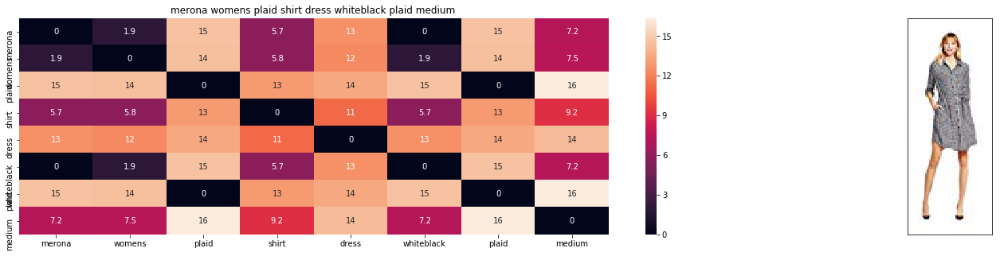

ASIN : B06ZY49W4D
Brand : Merona
euclidean distance from input : 0.0


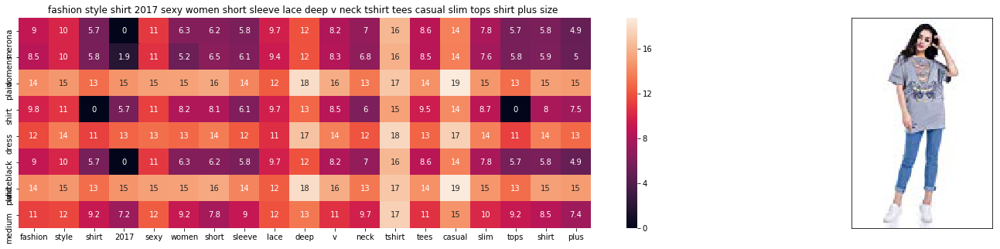

ASIN : B01MS2NG40
Brand : LHS Charmer
euclidean distance from input : 14.32585510171142


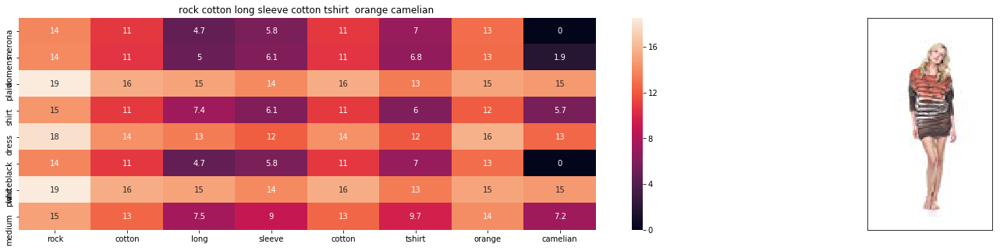

ASIN : B01F2LDFGM
Brand : Rock Cotton
euclidean distance from input : 14.491083945400385


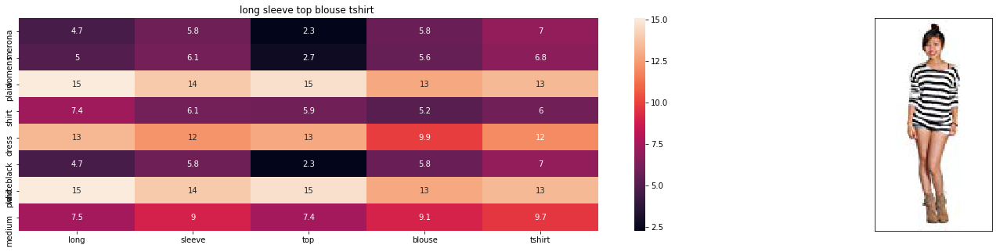

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from input : 14.54814655961927


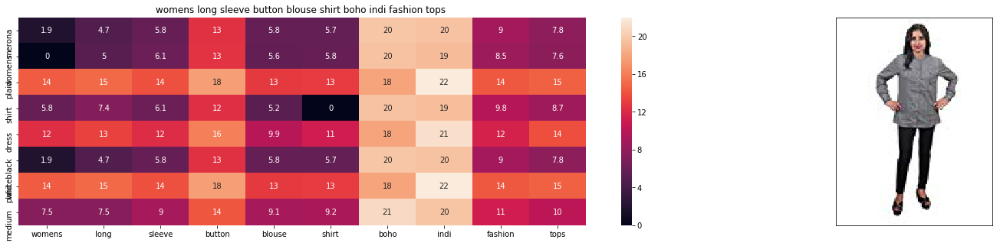

ASIN : B012WGJT6A
Brand : Mogul Interior
euclidean distance from input : 14.650228309812036


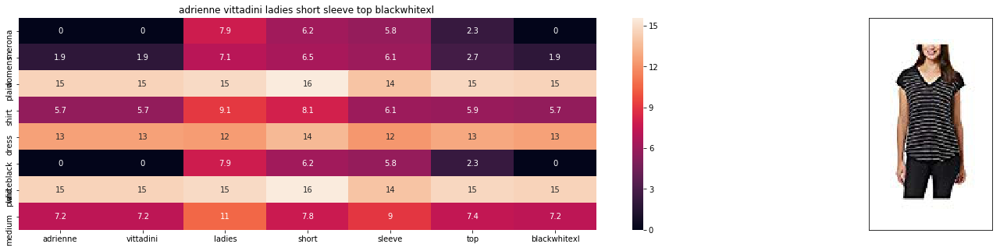

ASIN : B06XQPNX27
Brand : Adrienne Vittadini
euclidean distance from input : 14.692377020739874


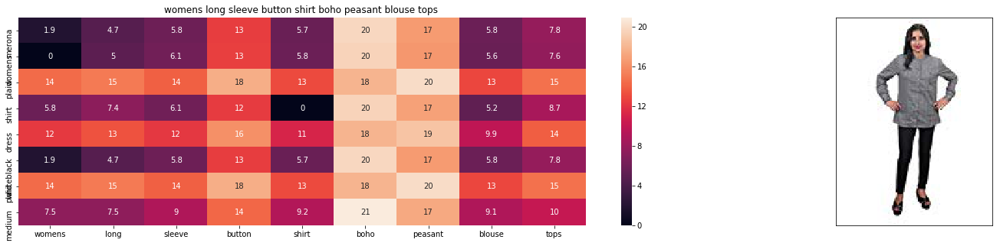

ASIN : B012WG9V2C
Brand : Mogul Interior
euclidean distance from input : 14.697076606931176


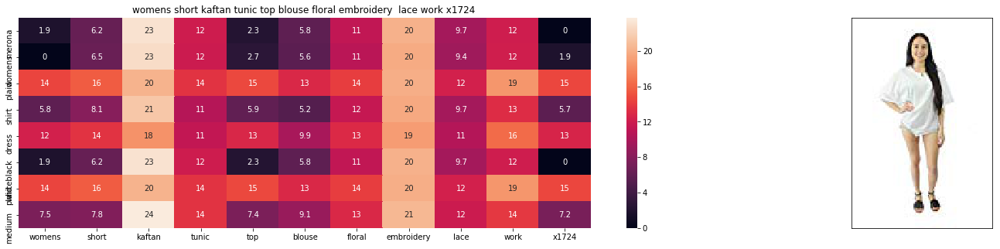

ASIN : B073YN5R72
Brand : Exclusive Handcrafts
euclidean distance from input : 14.70379814065185


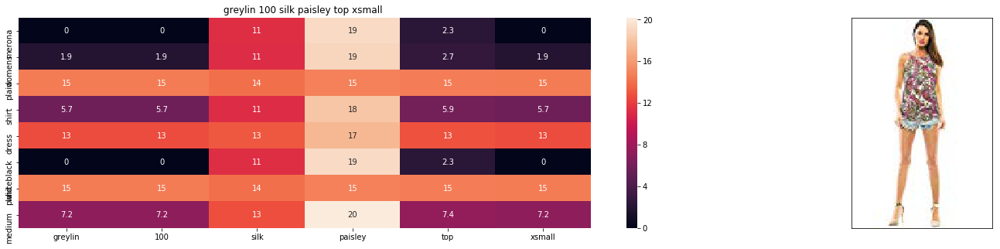

ASIN : B01FY8NM6G
Brand : Greylin
euclidean distance from input : 14.71845913304682


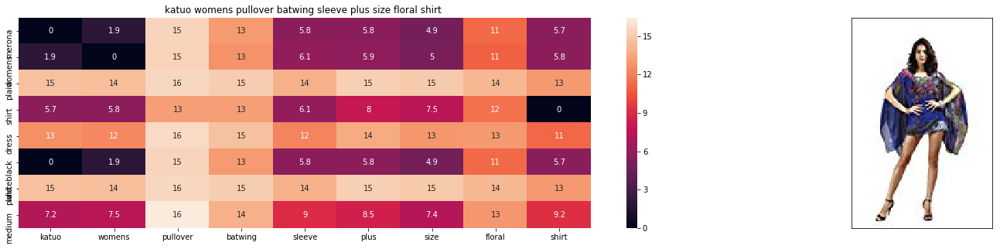

ASIN : B00XDKGII2
Brand : KATUO
euclidean distance from input : 14.757241252797797


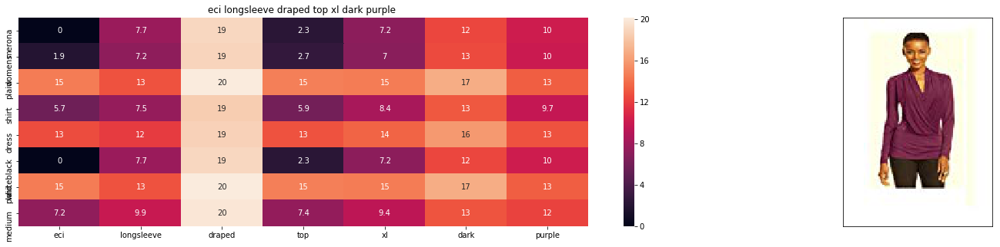

ASIN : B0753K3LBT
Brand : ECI
euclidean distance from input : 14.79509853280273


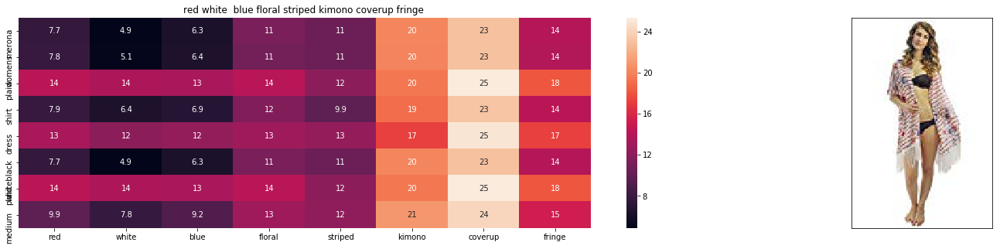

ASIN : B01BX9GI3Y
Brand : Luxury Divas
euclidean distance from input : 14.825196684963373


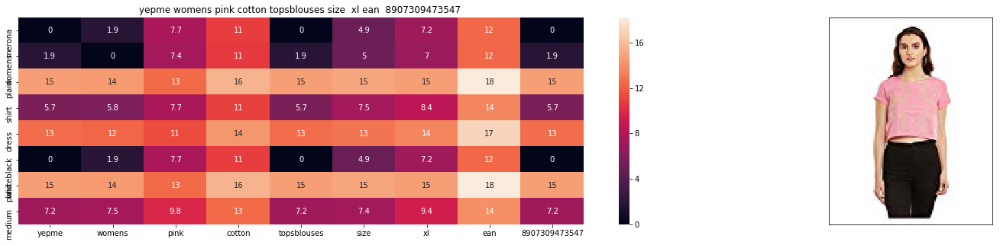

ASIN : B01M3VAYU1
Brand : Yepme
euclidean distance from input : 14.825882152456


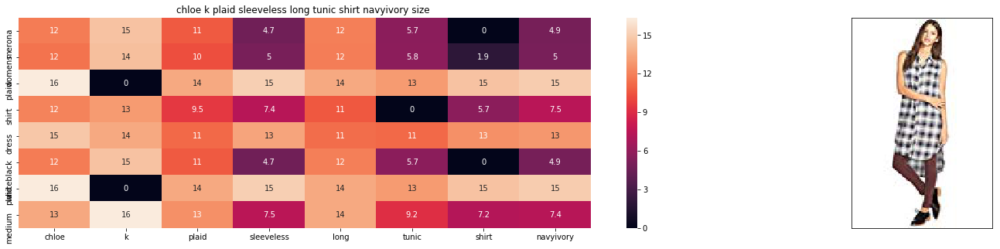

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 14.878023757106927


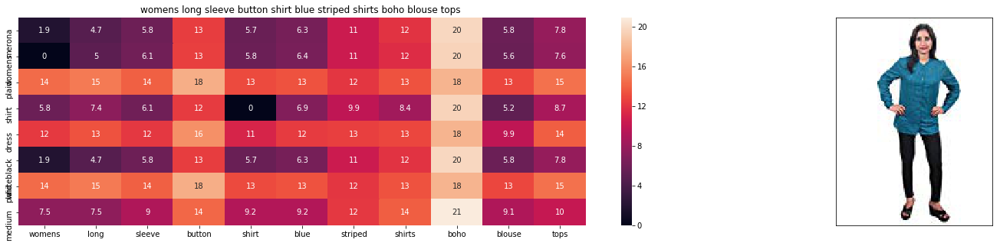

ASIN : B012WHTWZW
Brand : Mogul Interior
euclidean distance from input : 14.895042610349146


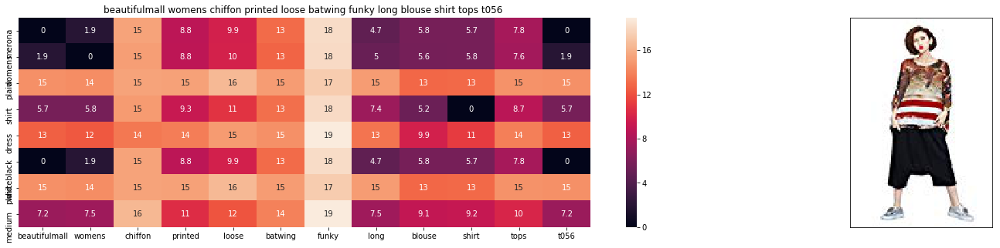

ASIN : B01HT8313S
Brand : Beautifulmall
euclidean distance from input : 15.005421477973666


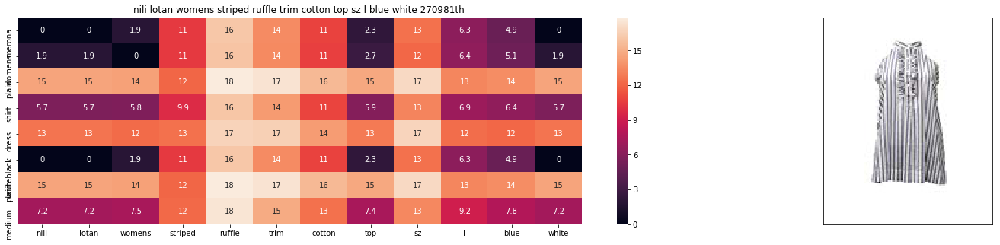

ASIN : B074PFR9CF
Brand : Nili Lotan
euclidean distance from input : 15.010300258535102


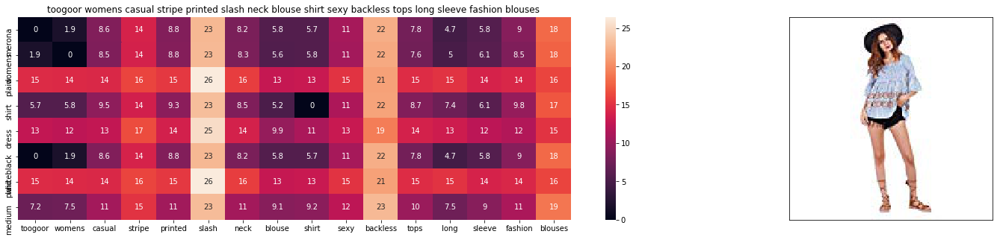

ASIN : B0746JN1DF
Brand : TOOGOO(R)
euclidean distance from input : 15.050822643178657


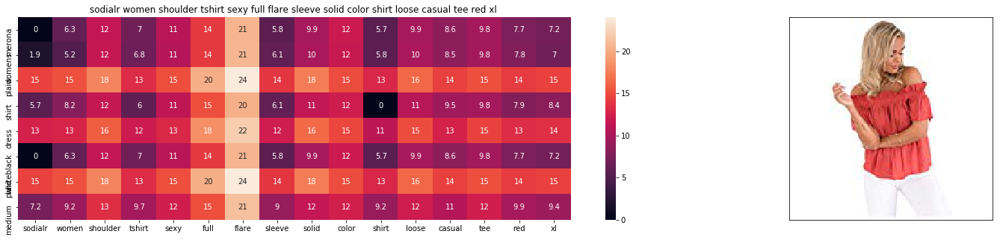

ASIN : B073WBF4D8
Brand : SODIAL(R)
euclidean distance from input : 15.055619651496617


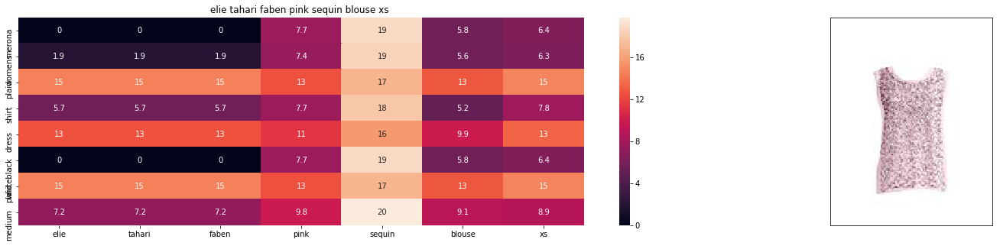

ASIN : B074VCVG5V
Brand : Elie Tahari
euclidean distance from input : 15.06302722138187


In [65]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(11235, 10, 5,5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 4 (with weights 5,5,10)

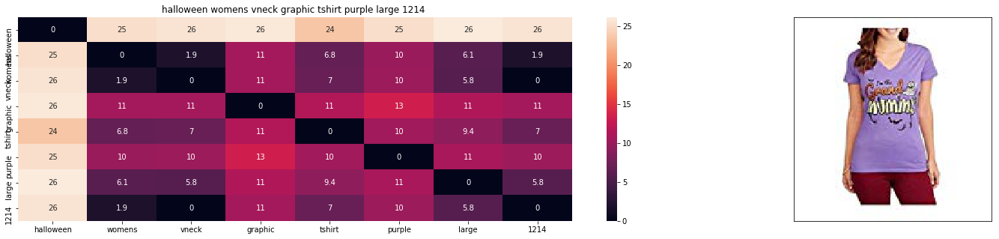

ASIN : B06XCRFF1M
Brand : Halloween
euclidean distance from input : 0.0


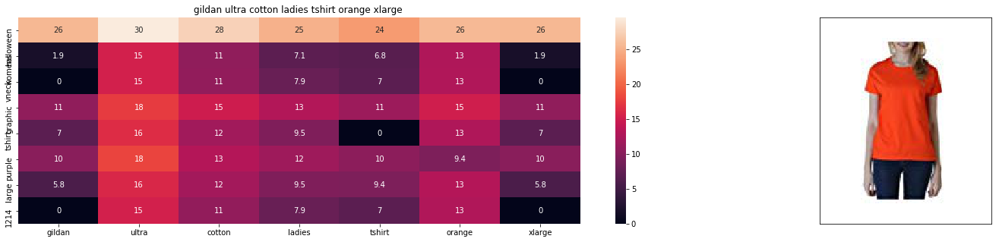

ASIN : B00XLFGBGS
Brand : Gildan
euclidean distance from input : 20.052983283996582


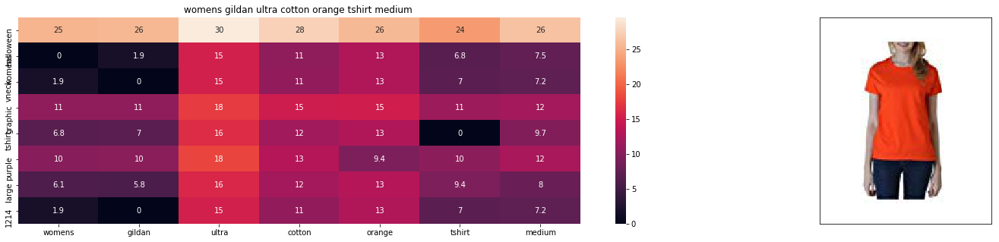

ASIN : B00XLFFL1O
Brand : Gildan
euclidean distance from input : 20.081412696838377


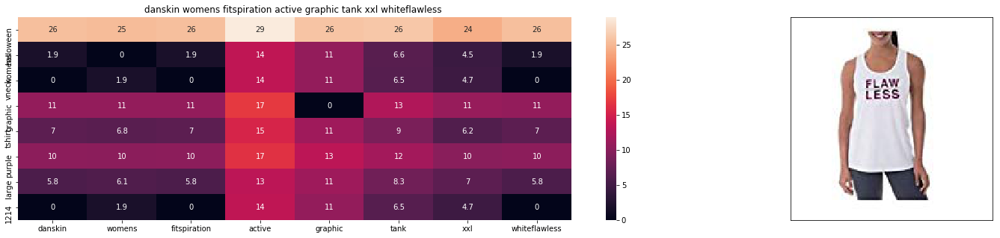

ASIN : B06XKC5MQ1
Brand : Danskin
euclidean distance from input : 21.352635482686715


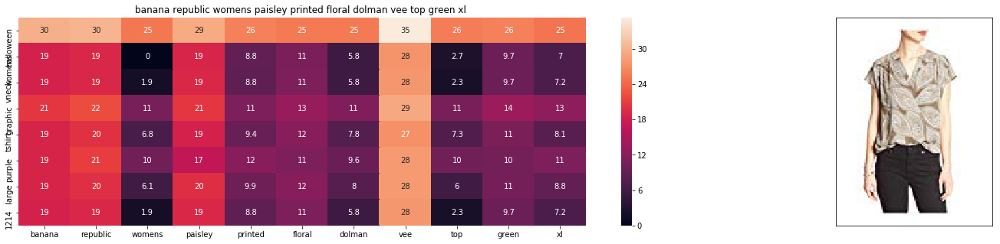

ASIN : B06XNXRK6K
Brand : Banana Republic
euclidean distance from input : 21.375638103665796


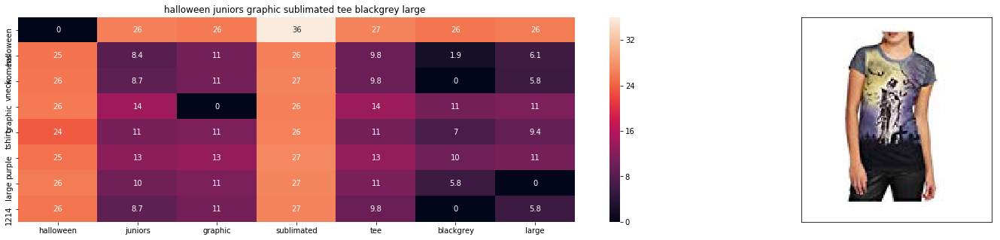

ASIN : B06Y6DJV2P
Brand : Halloween
euclidean distance from input : 21.387487151049932


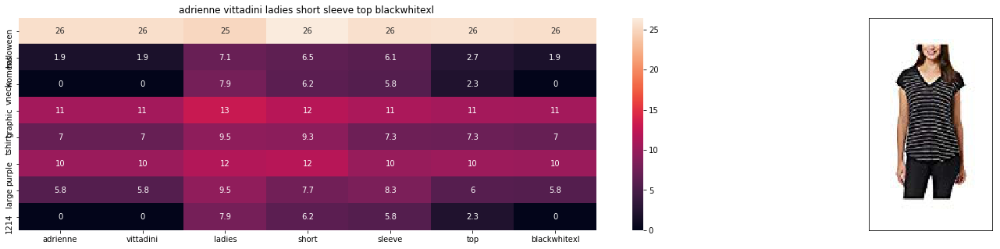

ASIN : B06XQPNX27
Brand : Adrienne Vittadini
euclidean distance from input : 21.65430854714599


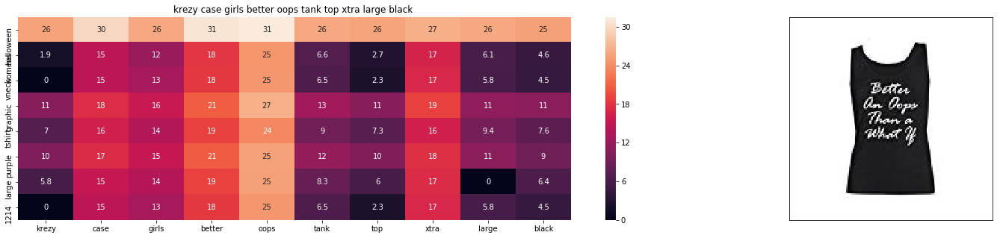

ASIN : B018RP0CDO
Brand : Krezy Case
euclidean distance from input : 21.819807437795355


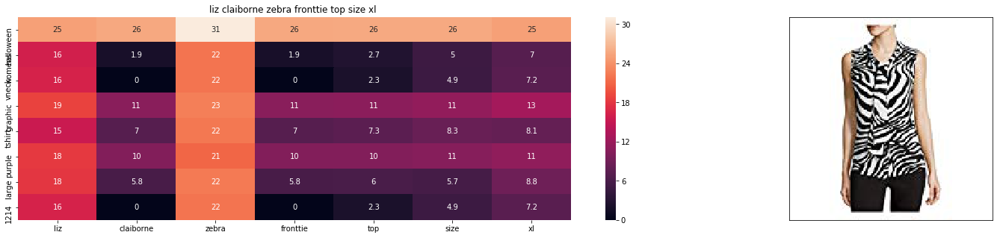

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 21.832881927490234


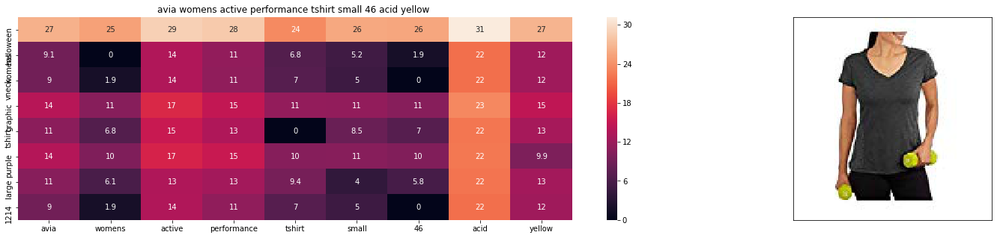

ASIN : B06X9B9M9F
Brand : Avia
euclidean distance from input : 21.859187702077584


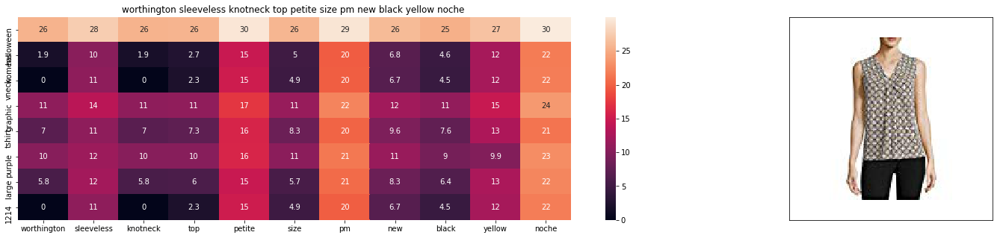

ASIN : B06Y519YRT
Brand : Worthington
euclidean distance from input : 22.14648323077151


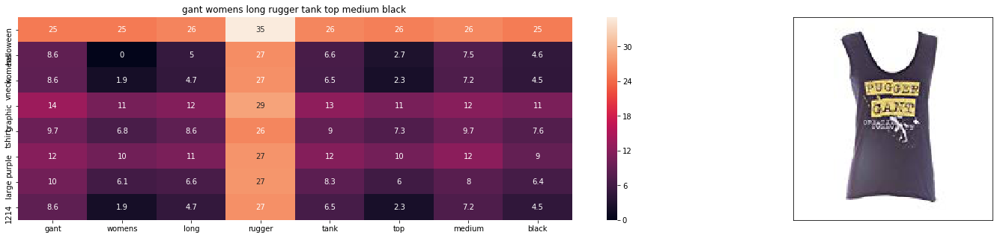

ASIN : B00YYZJFZI
Brand : GANT
euclidean distance from input : 22.151887072689203


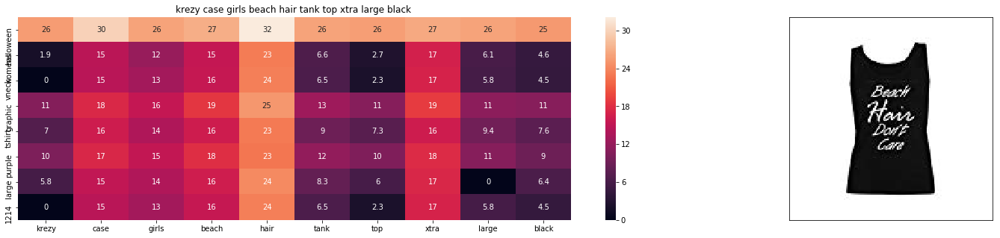

ASIN : B018ROZTB0
Brand : Krezy Case
euclidean distance from input : 22.230652908223824


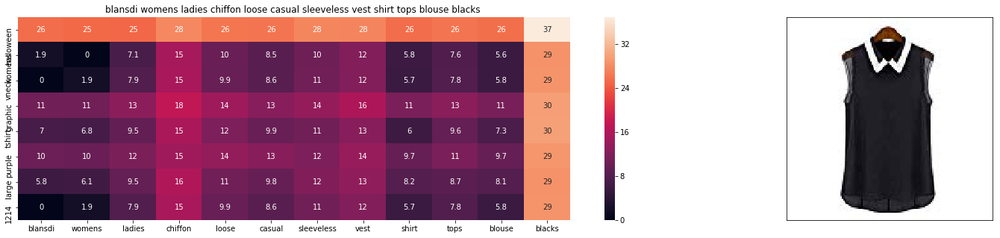

ASIN : B01B3Y99XA
Brand : Blansdi
euclidean distance from input : 22.253136444091798


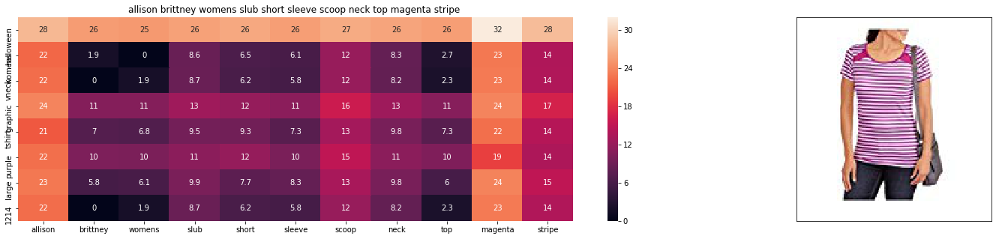

ASIN : B01N3489HI
Brand : Allison Brittney
euclidean distance from input : 22.346136096852973


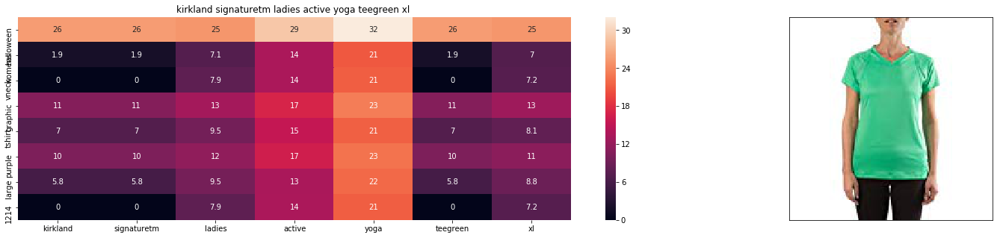

ASIN : B01LB5464I
Brand : Kirkland Signature
euclidean distance from input : 22.375667602241244


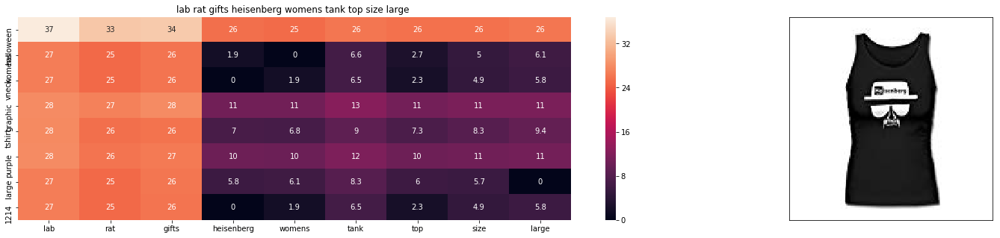

ASIN : B01MRHSGHP
Brand : Lab Rat Gifts
euclidean distance from input : 22.42346595681396


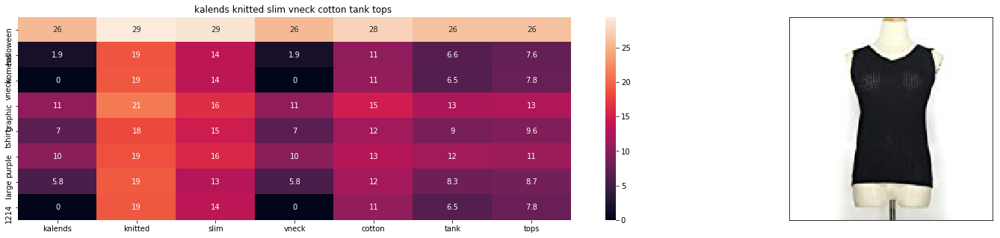

ASIN : B06XKWJWQD
Brand : KALENDS
euclidean distance from input : 22.527601051330567


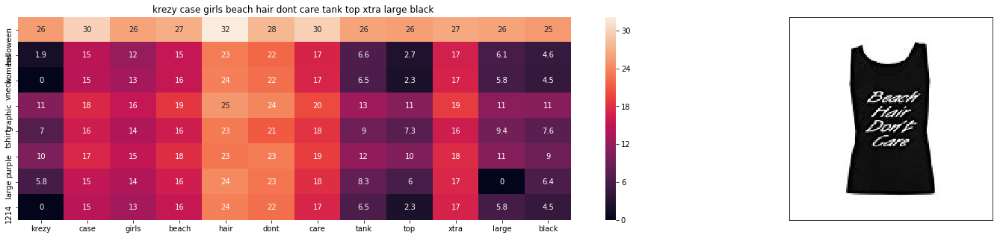

ASIN : B018ROZNYI
Brand : Krezy Case
euclidean distance from input : 22.594426826375678


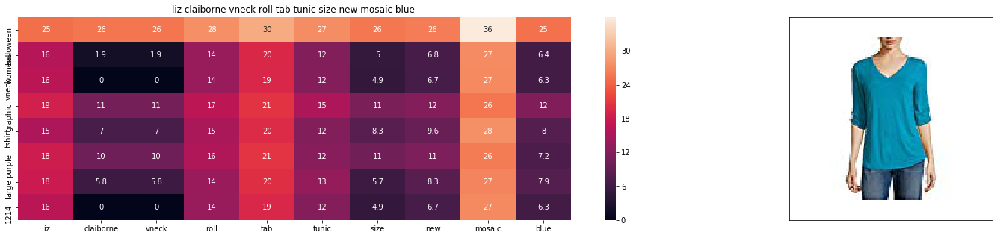

ASIN : B06XWH1Z1D
Brand : Liz Claiborne
euclidean distance from input : 22.608026790799585


In [68]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(10009, 5, 5,10, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 5 (with weights 5,5,5)

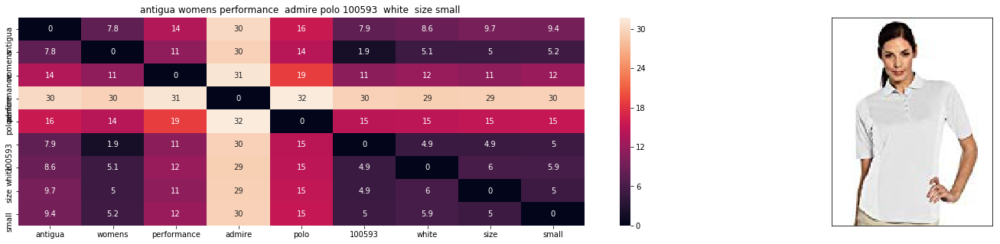

ASIN : B00E9AHC80
Brand : Antigua
euclidean distance from input : 0.010416666666666666


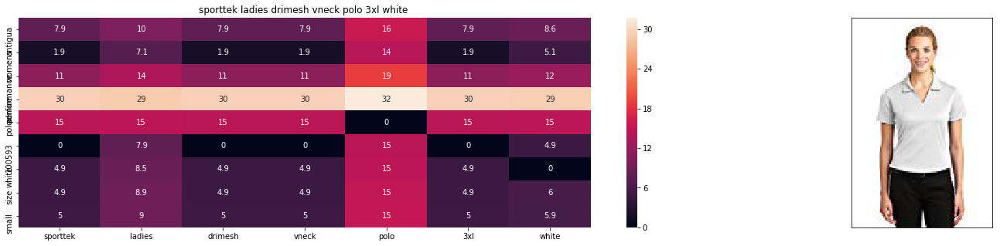

ASIN : B008PVBYWY
Brand : Sport-Tek
euclidean distance from input : 17.6226547290722


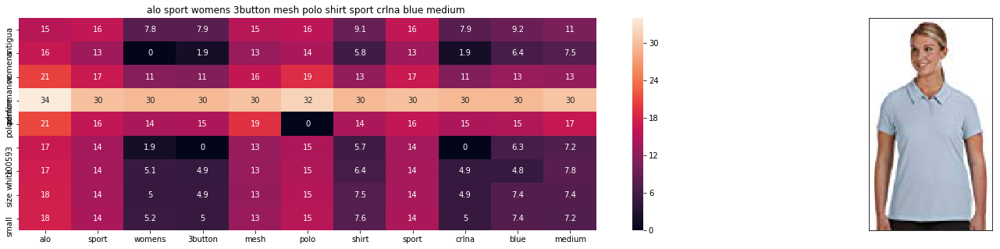

ASIN : B00IM7XQ40
Brand : ALO Sport
euclidean distance from input : 17.715580754462817


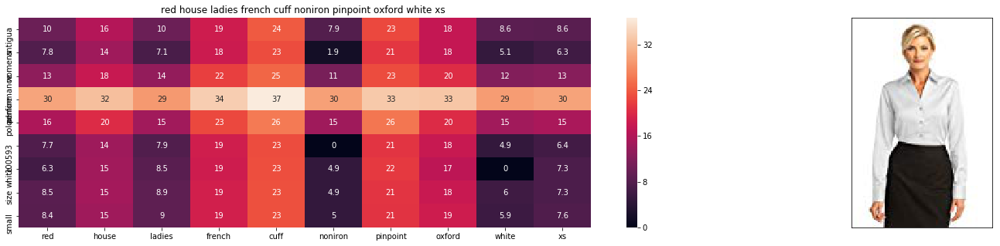

ASIN : B0090A7JX2
Brand : Red House
euclidean distance from input : 17.758939620836518


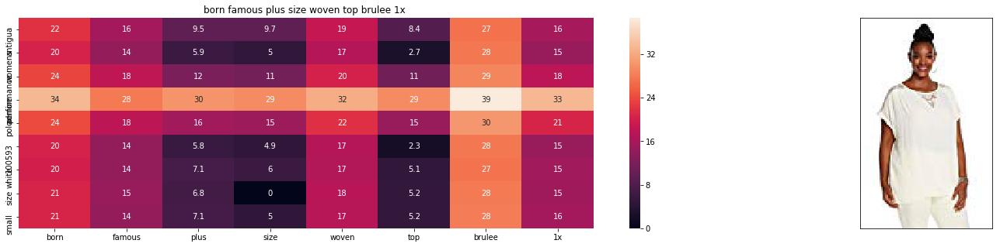

ASIN : B01MQDO07E
Brand : Born Famous
euclidean distance from input : 18.02217484015618


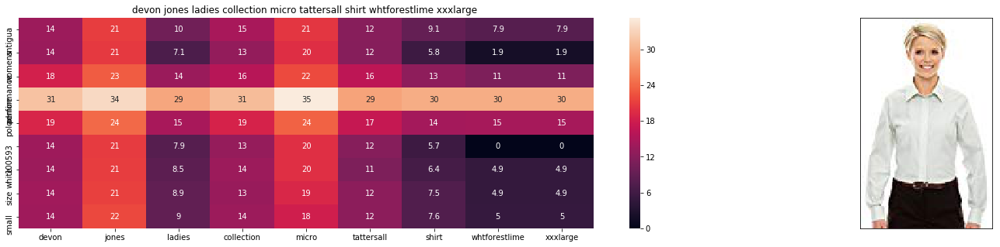

ASIN : B01GGAEAFI
Brand : Devon & Jones
euclidean distance from input : 18.168788823048548


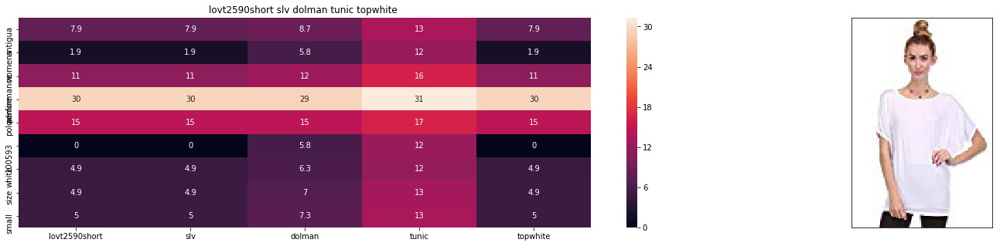

ASIN : B07438BW2N
Brand : Love In
euclidean distance from input : 18.23907512270525


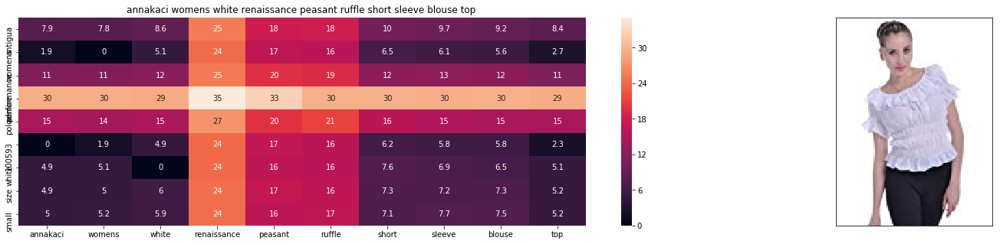

ASIN : B0759L22PR
Brand : Anna-Kaci
euclidean distance from input : 18.25136630235507


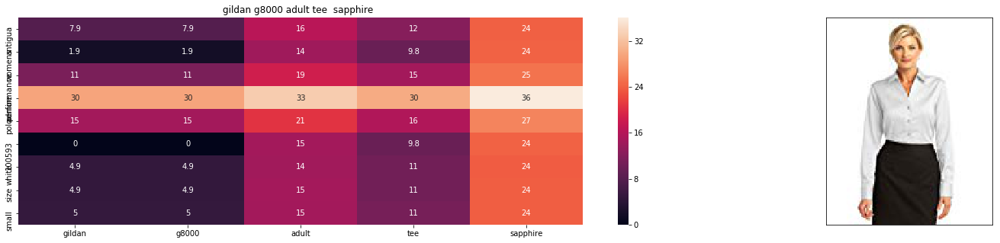

ASIN : B008VT7VWC
Brand : Red House
euclidean distance from input : 18.273352818671803


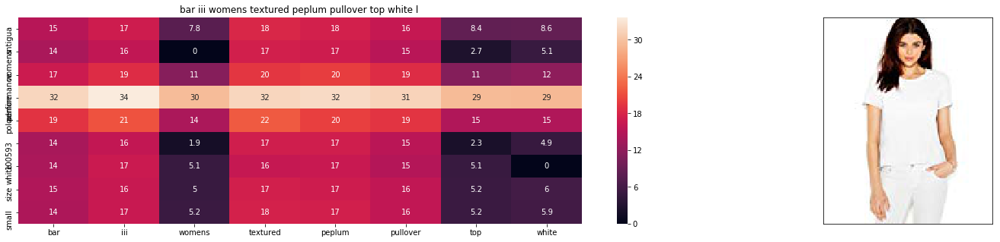

ASIN : B01EZ5PNOI
Brand : Bar III
euclidean distance from input : 18.315701836775887


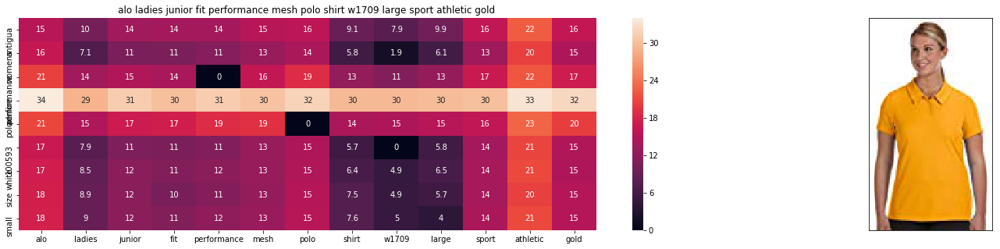

ASIN : B00PH3DJC6
Brand : All Sport
euclidean distance from input : 18.35502094483403


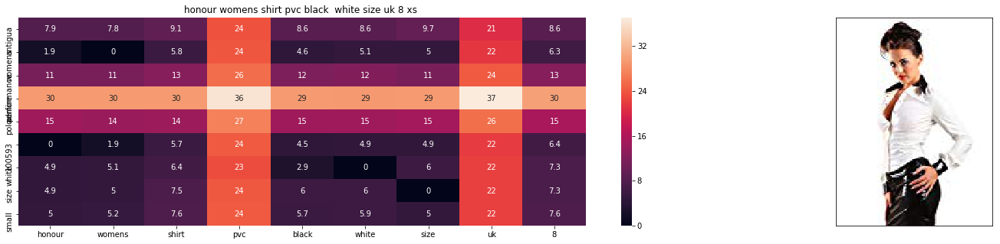

ASIN : B009WU3BU0
Brand : Honour
euclidean distance from input : 18.4113041266115


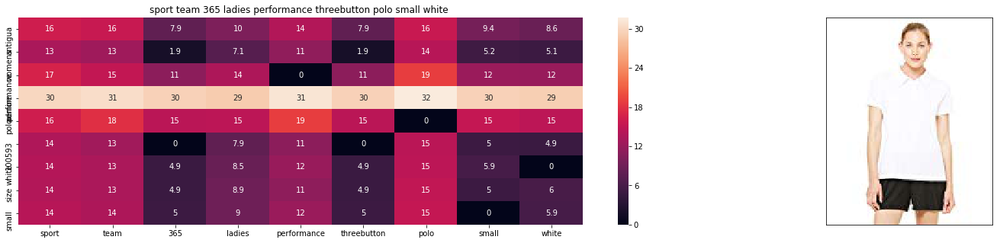

ASIN : B014WBKAXY
Brand : ALO Sport
euclidean distance from input : 18.535175230534026


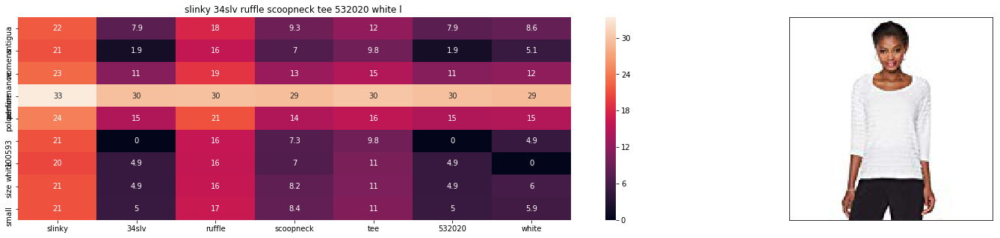

ASIN : B0759W1F8F
Brand : Slinky
euclidean distance from input : 18.55476748160646


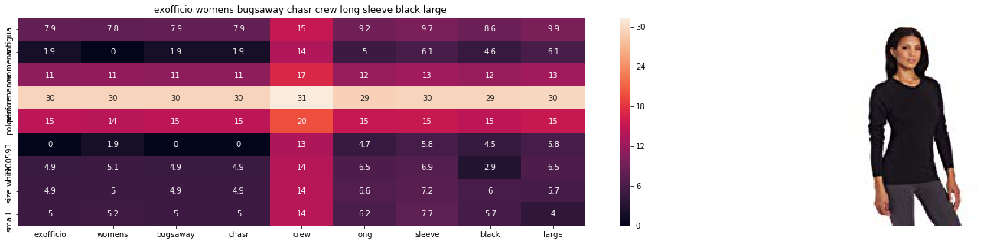

ASIN : B0043EVW0Q
Brand : ExOfficio
euclidean distance from input : 18.558260522374667


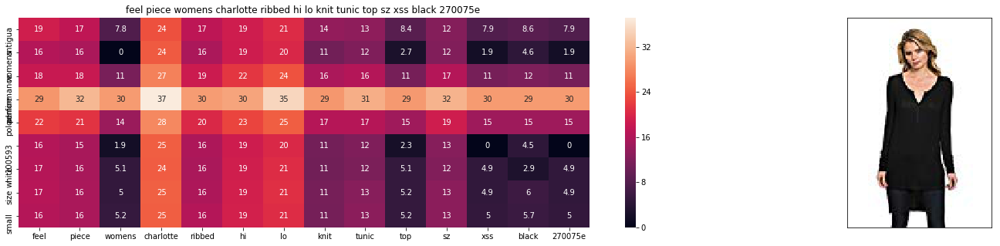

ASIN : B074TZTTP1
Brand : Feel The Piece
euclidean distance from input : 18.655788217076815


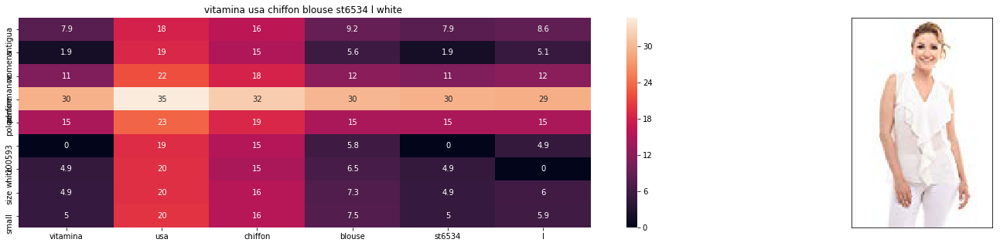

ASIN : B011CZQ6Y0
Brand : Vitamina USA
euclidean distance from input : 18.73423884951189


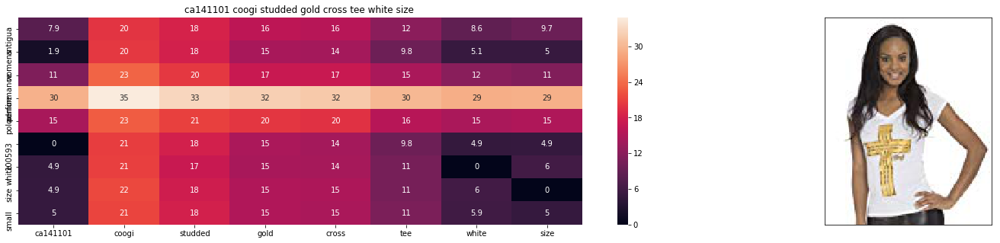

ASIN : B00KN2X2PA
Brand : COOGI
euclidean distance from input : 18.73869425467775


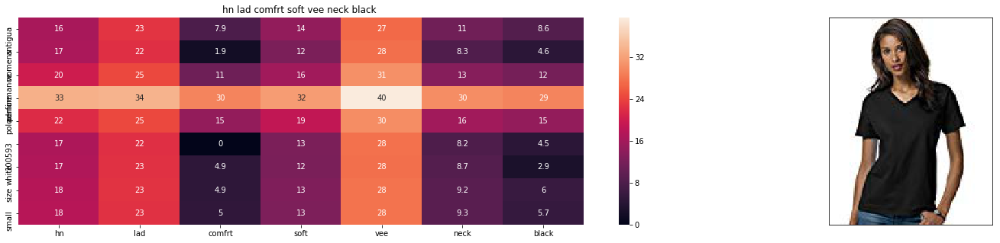

ASIN : B003EZMF38
Brand : Hanes
euclidean distance from input : 18.7529172261556


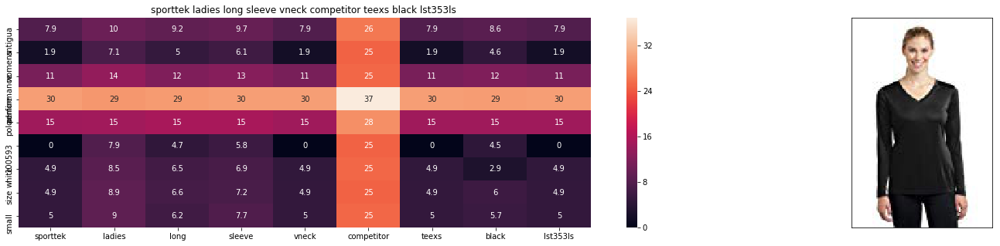

ASIN : B00J9UIK0O
Brand : Sport-Tek
euclidean distance from input : 18.76166649359856


In [73]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(897, 5, 5,5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 6 (with weights 10,5,5)

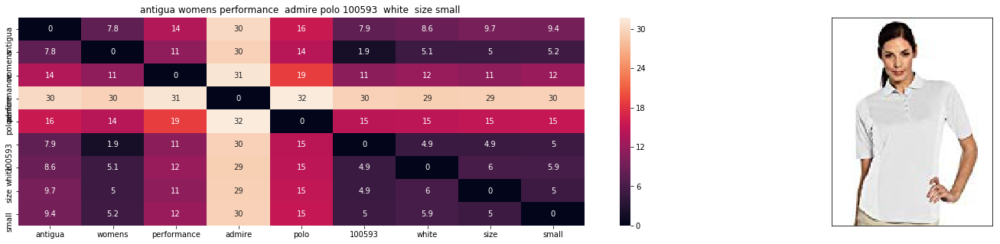

ASIN : B00E9AHC80
Brand : Antigua
euclidean distance from input : 0.0078125


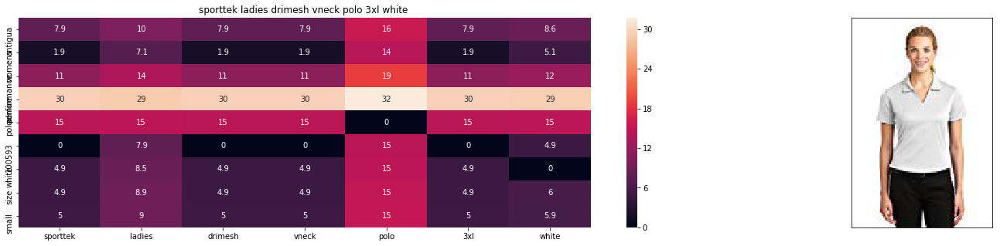

ASIN : B008PVBYWY
Brand : Sport-Tek
euclidean distance from input : 14.169545177358344


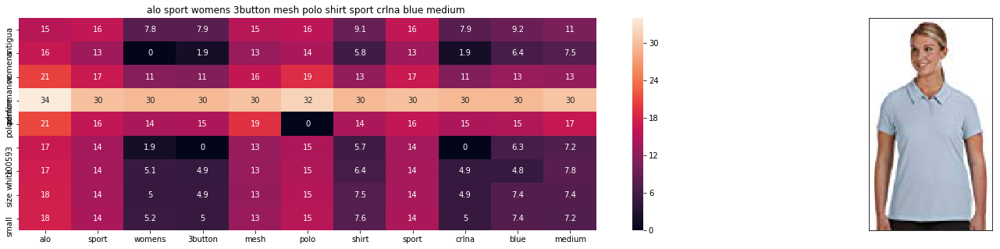

ASIN : B00IM7XQ40
Brand : ALO Sport
euclidean distance from input : 14.417151073354438


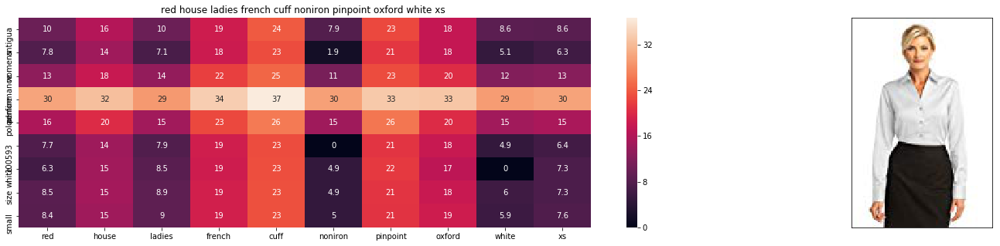

ASIN : B0090A7JX2
Brand : Red House
euclidean distance from input : 14.774059490102484


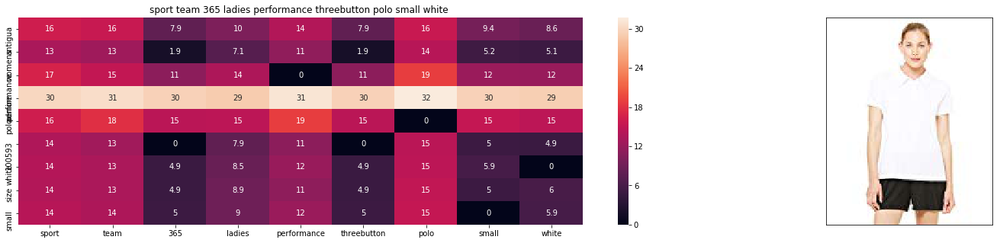

ASIN : B014WBKAXY
Brand : ALO Sport
euclidean distance from input : 14.86429360094007


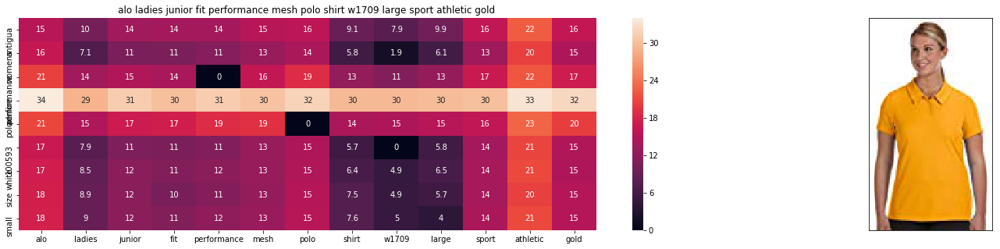

ASIN : B00PH3DJC6
Brand : All Sport
euclidean distance from input : 14.88413146179935


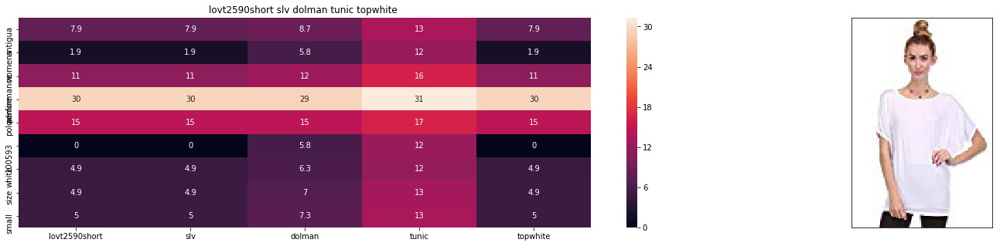

ASIN : B07438BW2N
Brand : Love In
euclidean distance from input : 14.894522406482062


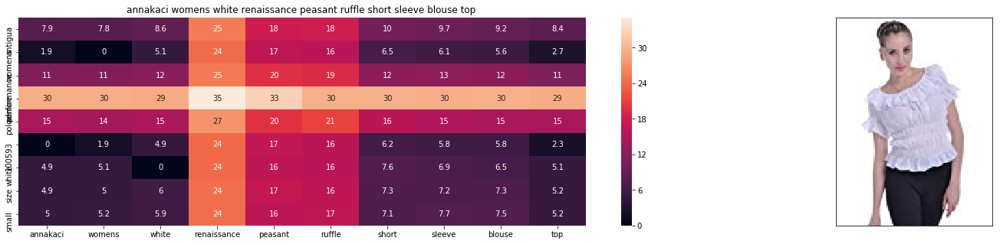

ASIN : B0759L22PR
Brand : Anna-Kaci
euclidean distance from input : 14.903301624196724


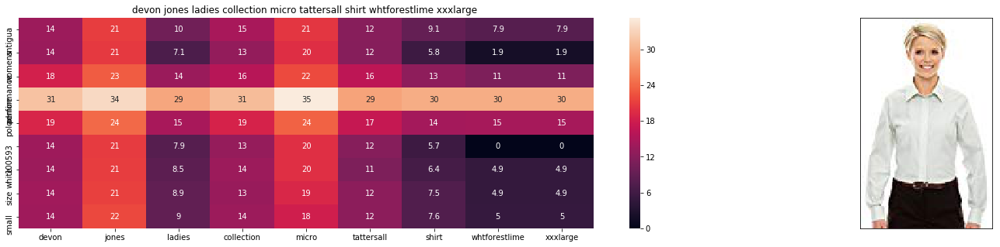

ASIN : B01GGAEAFI
Brand : Devon & Jones
euclidean distance from input : 14.998604232490269


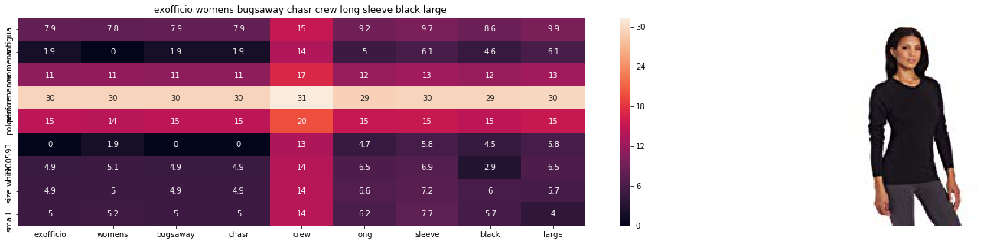

ASIN : B0043EVW0Q
Brand : ExOfficio
euclidean distance from input : 15.025372351772456


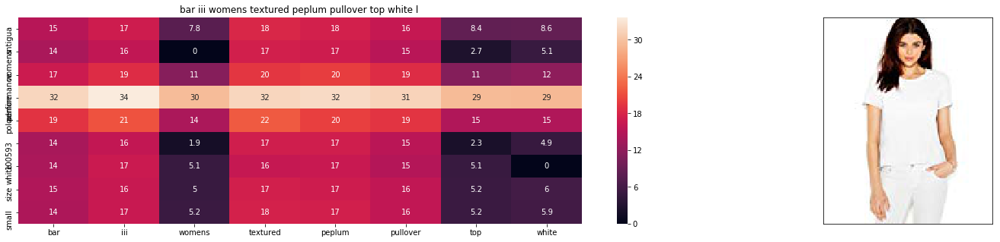

ASIN : B01EZ5PNOI
Brand : Bar III
euclidean distance from input : 15.079344679736456


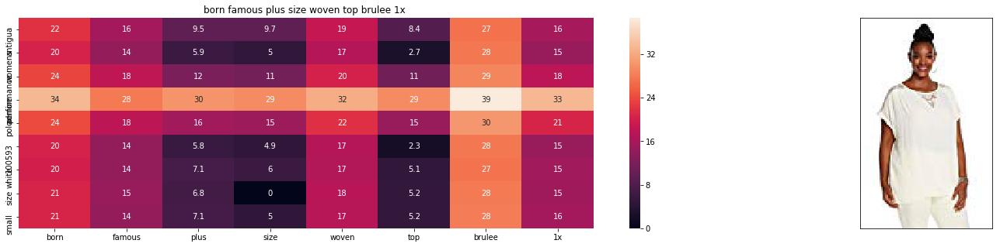

ASIN : B01MQDO07E
Brand : Born Famous
euclidean distance from input : 15.105232814687445


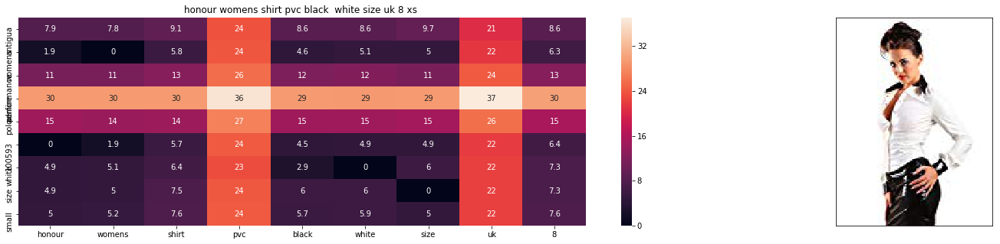

ASIN : B009WU3BU0
Brand : Honour
euclidean distance from input : 15.151825262927375


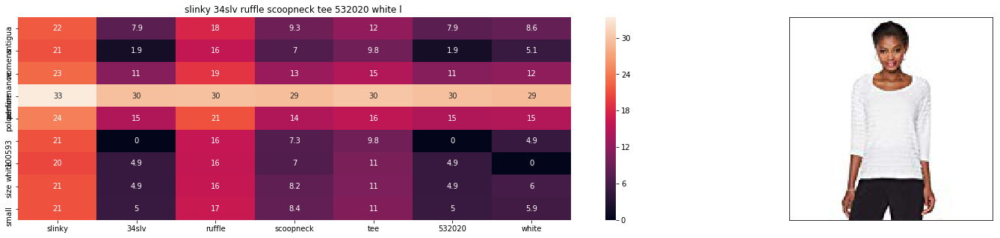

ASIN : B0759W1F8F
Brand : Slinky
euclidean distance from input : 15.206428337187512


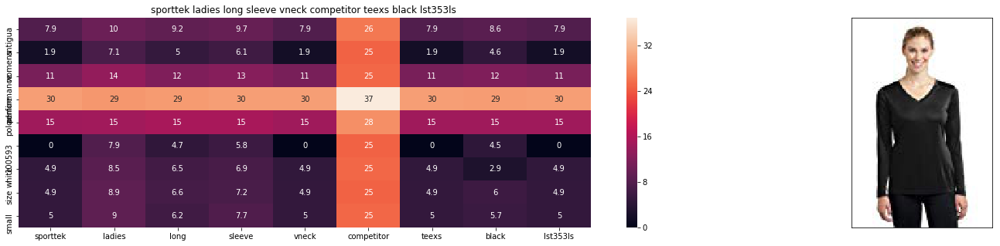

ASIN : B00J9UIK0O
Brand : Sport-Tek
euclidean distance from input : 15.258154682058052


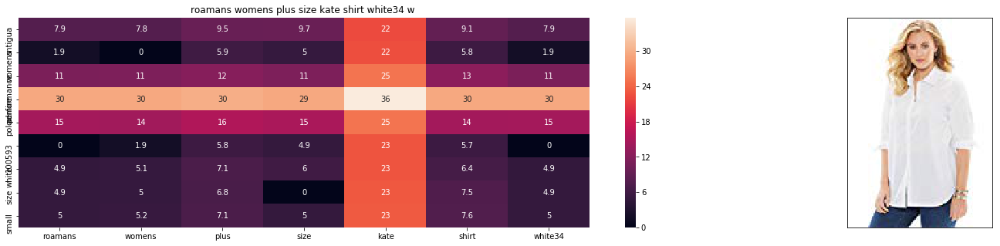

ASIN : B072JKHLD7
Brand : Roamans
euclidean distance from input : 15.271861839384778


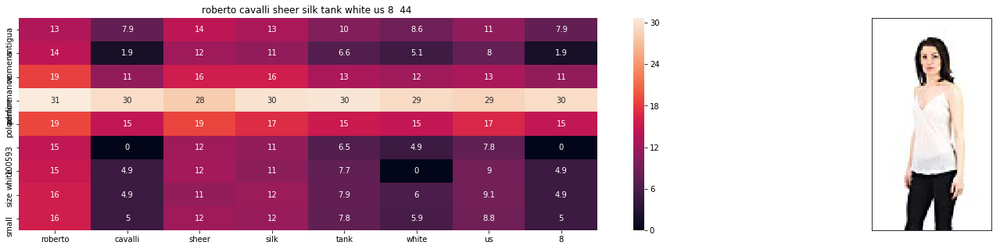

ASIN : B01MXVC8A4
Brand : Roberto Cavalli
euclidean distance from input : 15.284603812121711


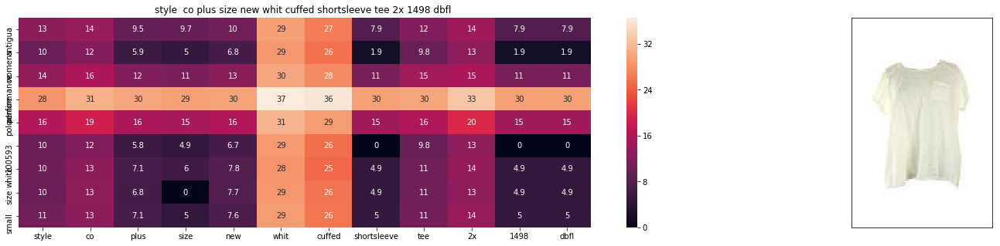

ASIN : B0178WOJVS
Brand : Styleco
euclidean distance from input : 15.298964309782727


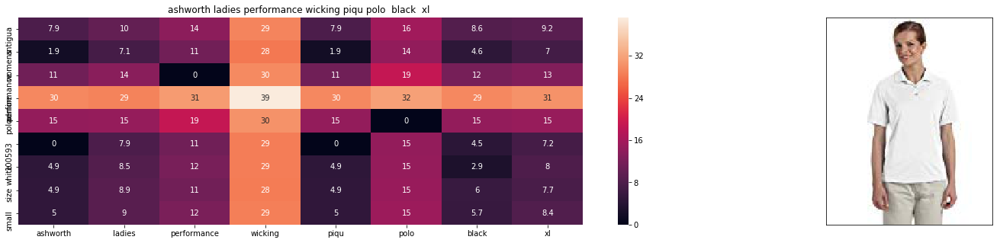

ASIN : B00CNQ5ORI
Brand : Ashworth
euclidean distance from input : 15.315540885925293


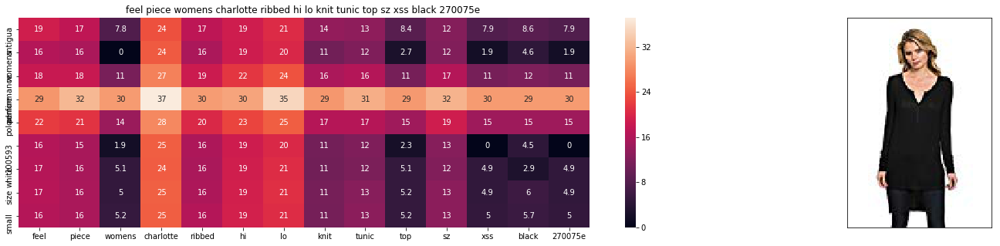

ASIN : B074TZTTP1
Brand : Feel The Piece
euclidean distance from input : 15.318439711696772


In [74]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(897, 10, 5,5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 7 (with weights 5,10,5)

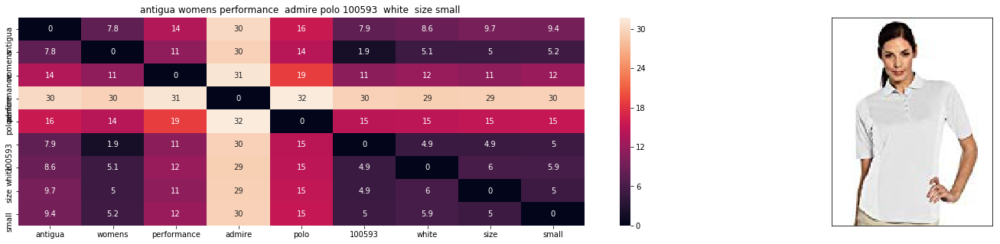

ASIN : B00E9AHC80
Brand : Antigua
euclidean distance from input : 0.0078125


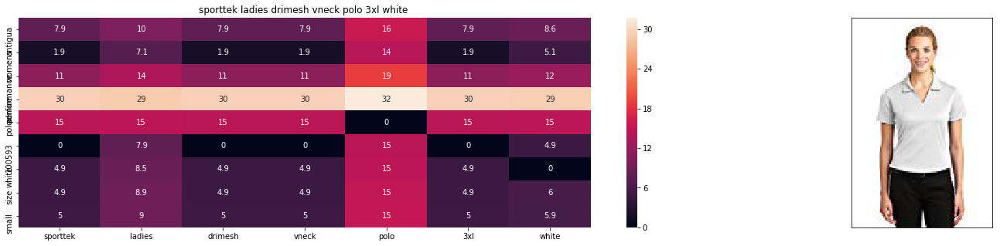

ASIN : B008PVBYWY
Brand : Sport-Tek
euclidean distance from input : 13.776008041179093


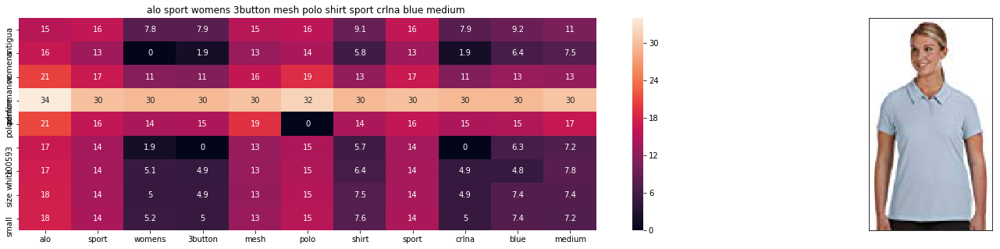

ASIN : B00IM7XQ40
Brand : ALO Sport
euclidean distance from input : 13.845702560222062


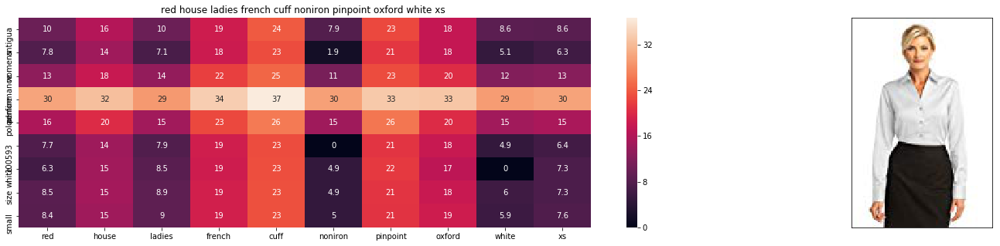

ASIN : B0090A7JX2
Brand : Red House
euclidean distance from input : 13.878221710002336


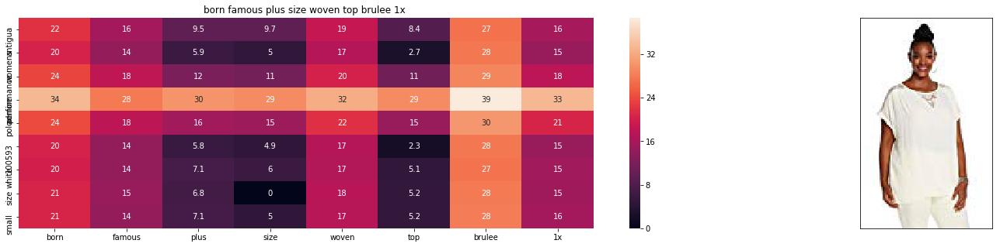

ASIN : B01MQDO07E
Brand : Born Famous
euclidean distance from input : 14.075648124492082


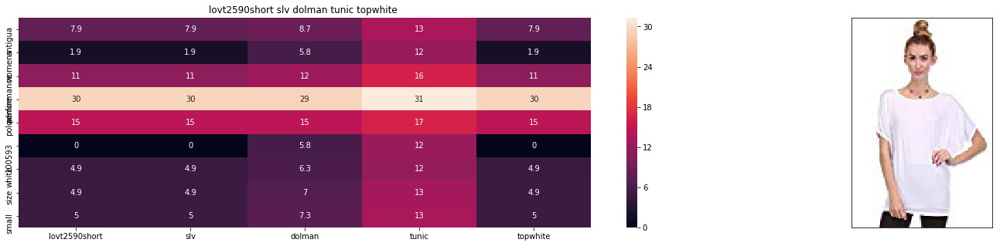

ASIN : B07438BW2N
Brand : Love In
euclidean distance from input : 14.112319043921158


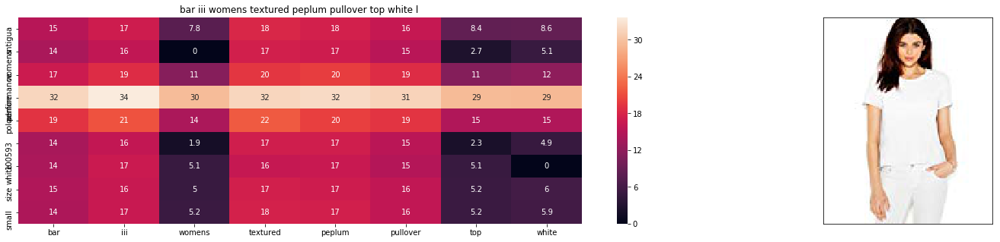

ASIN : B01EZ5PNOI
Brand : Bar III
euclidean distance from input : 14.169789079474137


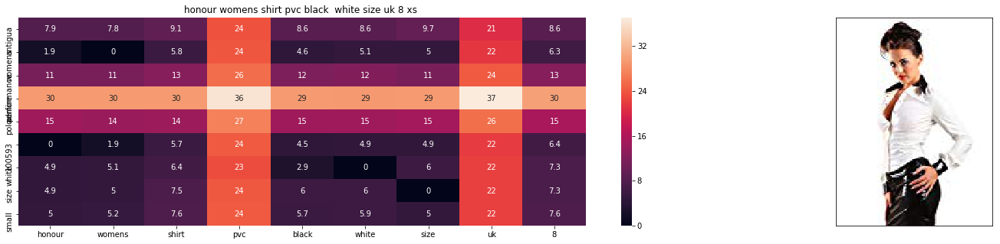

ASIN : B009WU3BU0
Brand : Honour
euclidean distance from input : 14.241490796850846


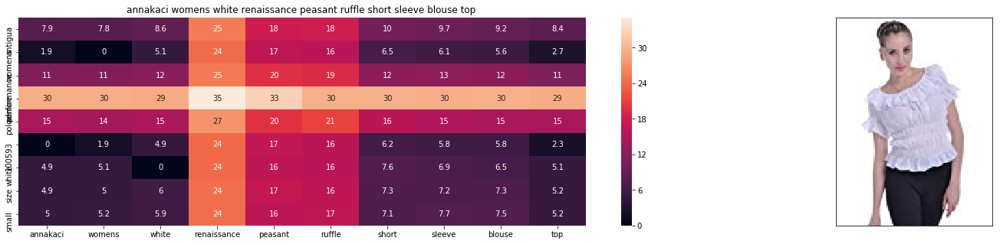

ASIN : B0759L22PR
Brand : Anna-Kaci
euclidean distance from input : 14.247541721141252


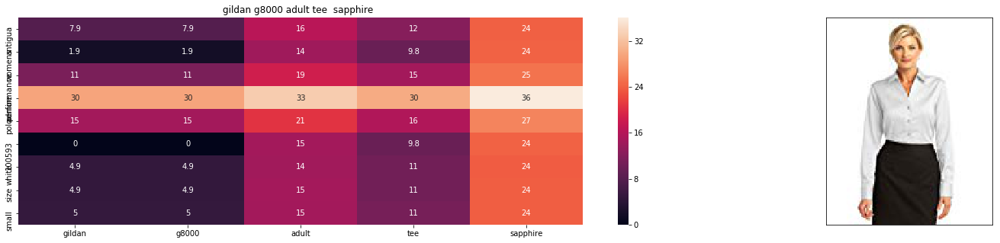

ASIN : B008VT7VWC
Brand : Red House
euclidean distance from input : 14.2640316083788


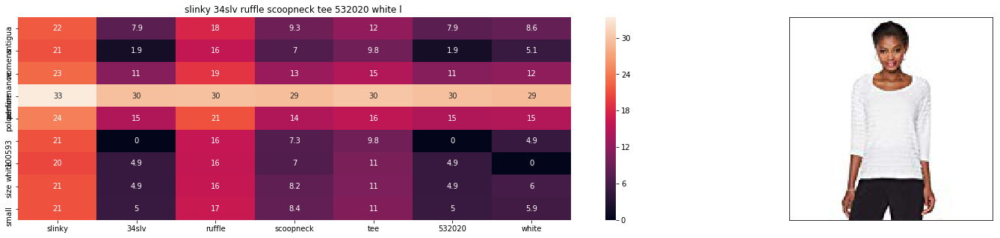

ASIN : B0759W1F8F
Brand : Slinky
euclidean distance from input : 14.269629001798119


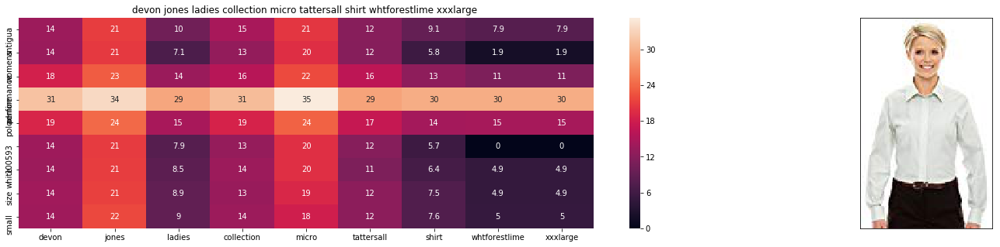

ASIN : B01GGAEAFI
Brand : Devon & Jones
euclidean distance from input : 14.288029445052558


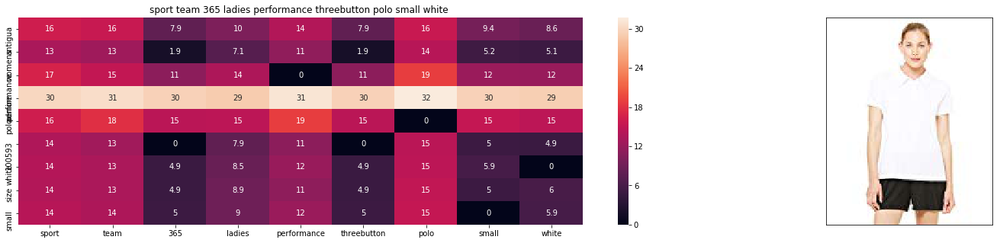

ASIN : B014WBKAXY
Brand : ALO Sport
euclidean distance from input : 14.334394124792741


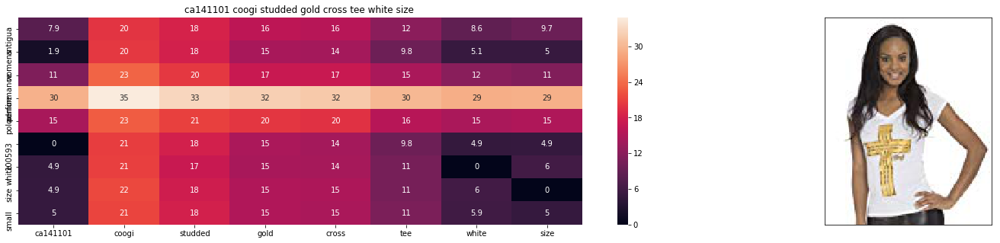

ASIN : B00KN2X2PA
Brand : COOGI
euclidean distance from input : 14.407574081601586


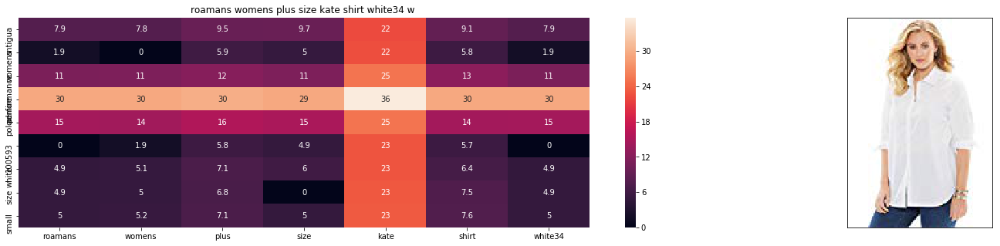

ASIN : B072JKHLD7
Brand : Roamans
euclidean distance from input : 14.425713062467064


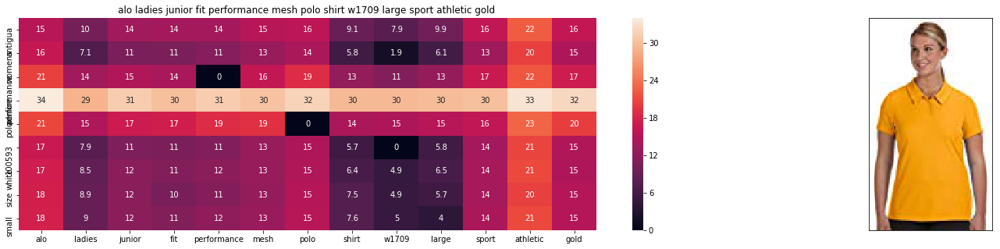

ASIN : B00PH3DJC6
Brand : All Sport
euclidean distance from input : 14.42770353639167


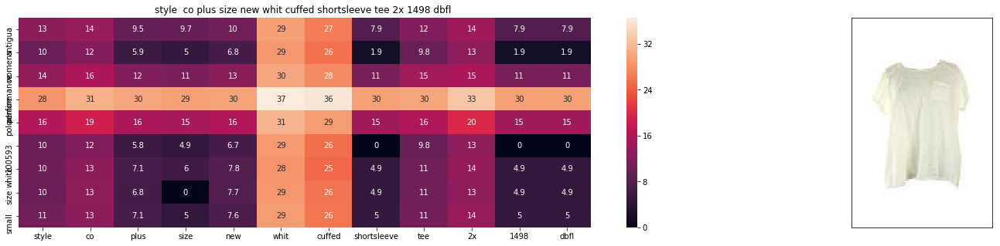

ASIN : B0178WOJVS
Brand : Styleco
euclidean distance from input : 14.446947097959008


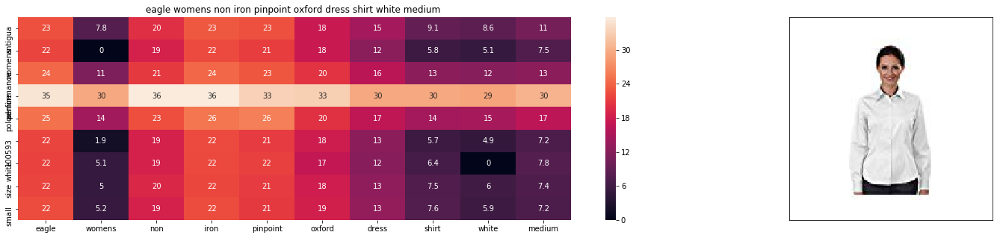

ASIN : B01DJMU18Q
Brand : Eagle
euclidean distance from input : 14.474036789121119


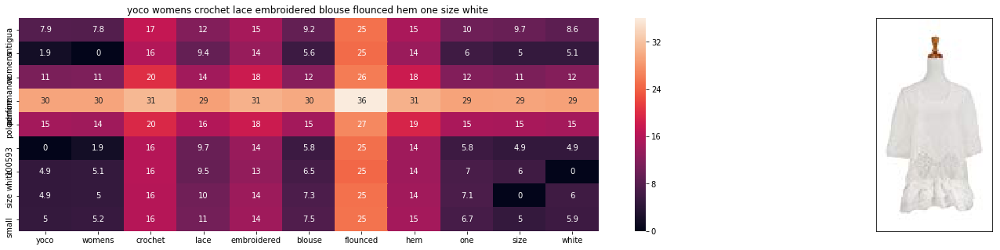

ASIN : B00JU8OWQQ
Brand : Yoco
euclidean distance from input : 14.478966522397485


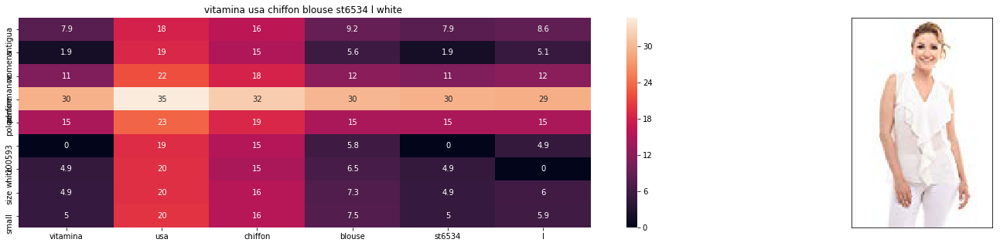

ASIN : B011CZQ6Y0
Brand : Vitamina USA
euclidean distance from input : 14.48369183902614


In [76]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(897, 5, 10,5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Test case- 8 (with weights 5,5,10)

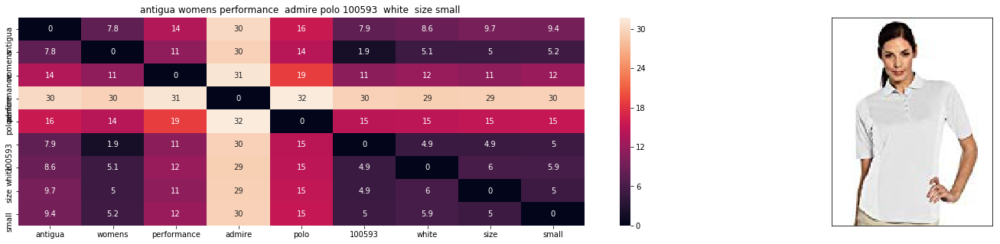

ASIN : B00E9AHC80
Brand : Antigua
euclidean distance from input : 0.015625


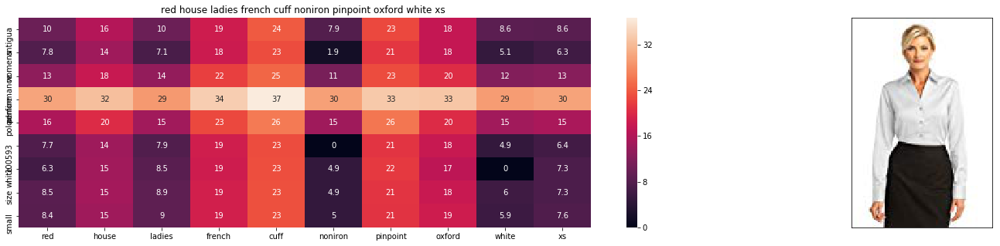

ASIN : B0090A7JX2
Brand : Red House
euclidean distance from input : 24.62453766240473


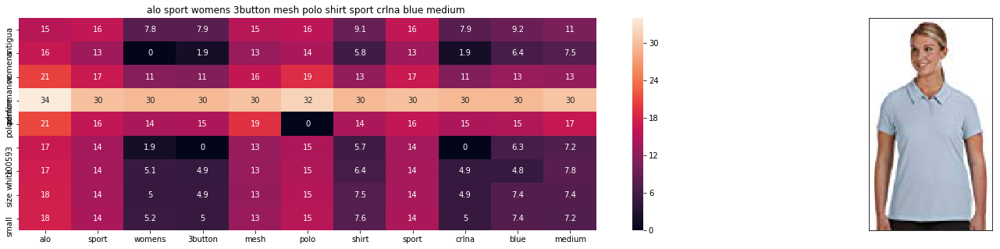

ASIN : B00IM7XQ40
Brand : ALO Sport
euclidean distance from input : 24.883888629811956


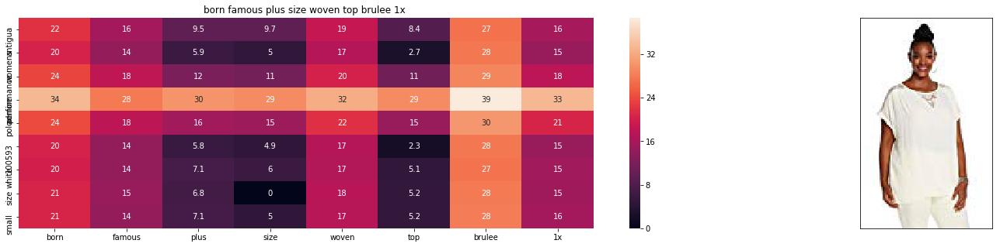

ASIN : B01MQDO07E
Brand : Born Famous
euclidean distance from input : 24.88564358128901


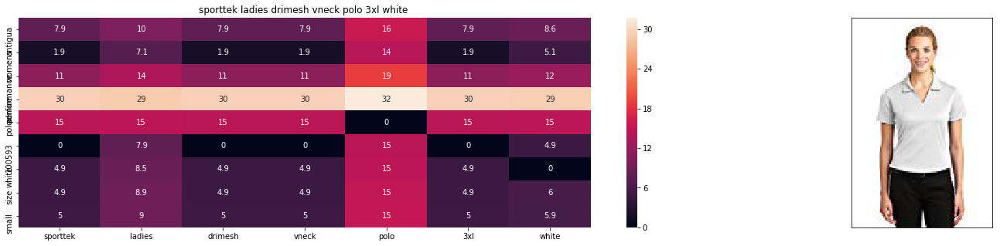

ASIN : B008PVBYWY
Brand : Sport-Tek
euclidean distance from input : 24.92241096867915


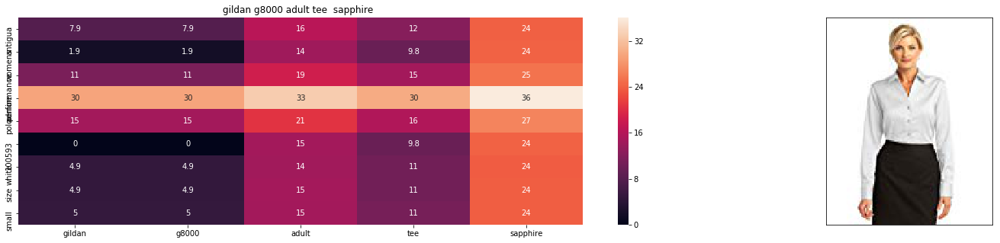

ASIN : B008VT7VWC
Brand : Red House
euclidean distance from input : 25.199742702382757


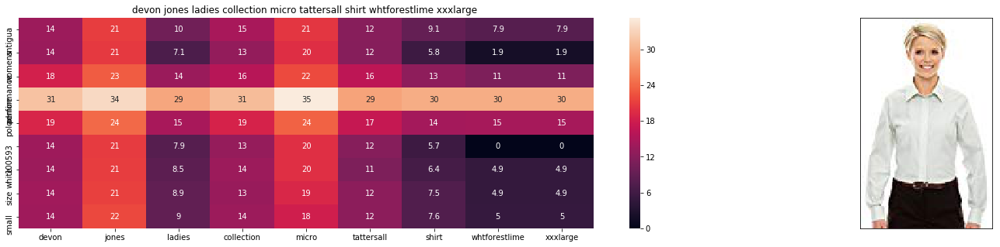

ASIN : B01GGAEAFI
Brand : Devon & Jones
euclidean distance from input : 25.219732791602816


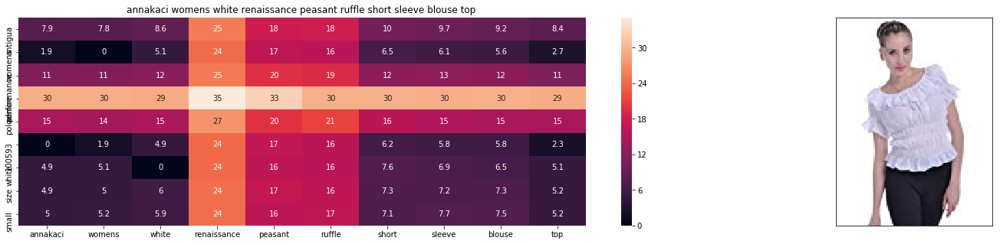

ASIN : B0759L22PR
Brand : Anna-Kaci
euclidean distance from input : 25.60325556172724


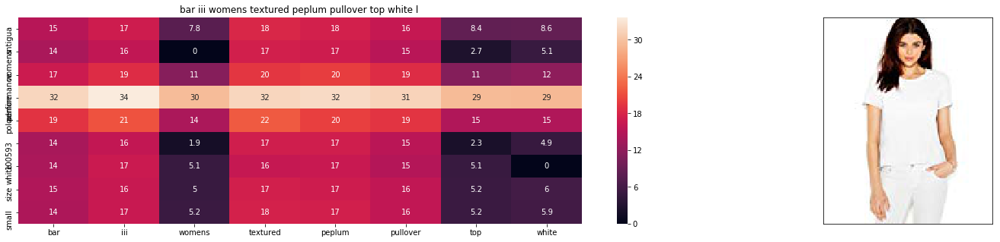

ASIN : B01EZ5PNOI
Brand : Bar III
euclidean distance from input : 25.697971751117073


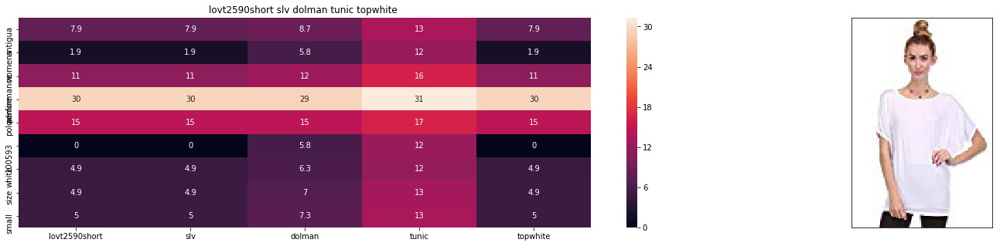

ASIN : B07438BW2N
Brand : Love In
euclidean distance from input : 25.710383917712534


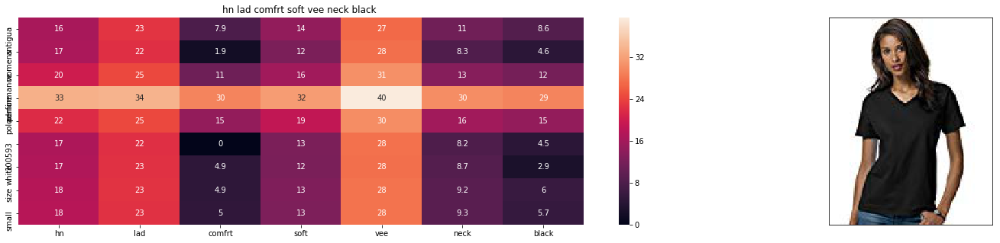

ASIN : B003EZMF38
Brand : Hanes
euclidean distance from input : 25.74971523284912


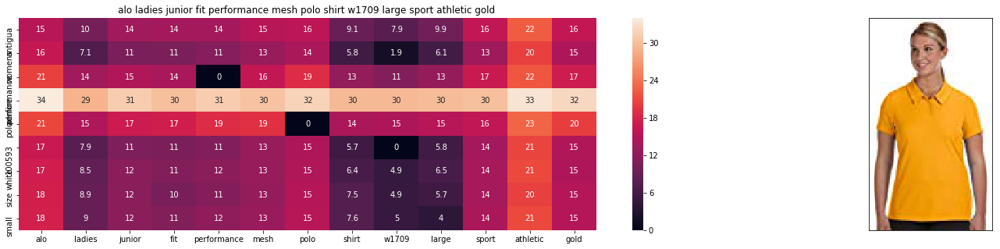

ASIN : B00PH3DJC6
Brand : All Sport
euclidean distance from input : 25.753227836311073


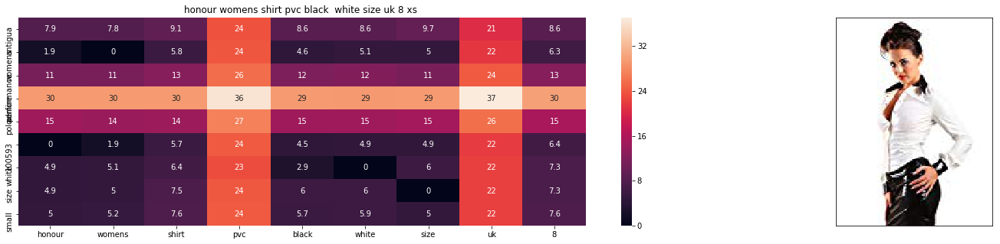

ASIN : B009WU3BU0
Brand : Honour
euclidean distance from input : 25.840596320056285


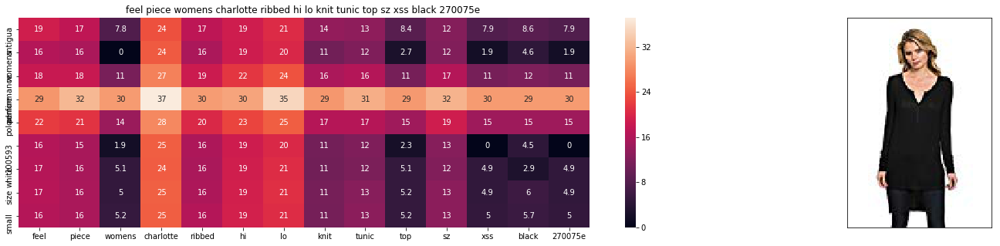

ASIN : B074TZTTP1
Brand : Feel The Piece
euclidean distance from input : 26.04471134103027


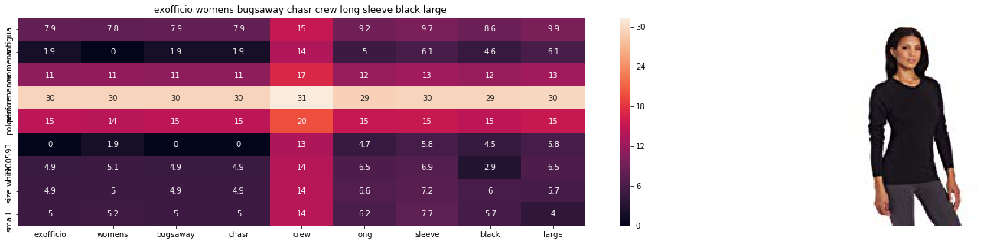

ASIN : B0043EVW0Q
Brand : ExOfficio
euclidean distance from input : 26.11834138787475


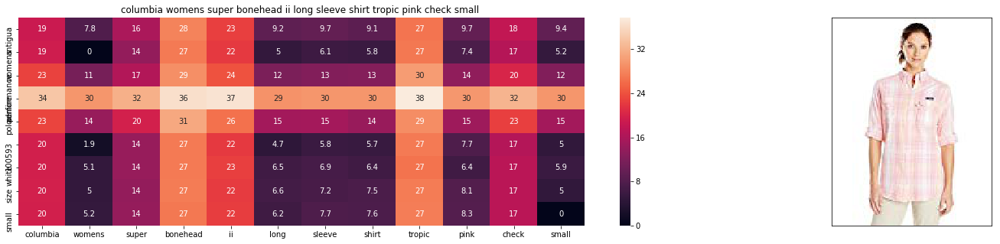

ASIN : B00L3KOJYO
Brand : Columbia
euclidean distance from input : 26.13043460864016


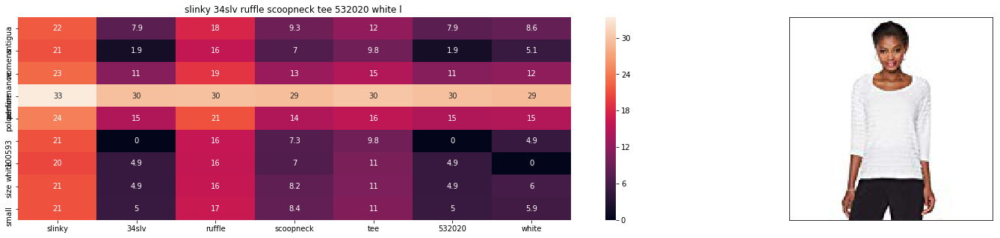

ASIN : B0759W1F8F
Brand : Slinky
euclidean distance from input : 26.188245105833754


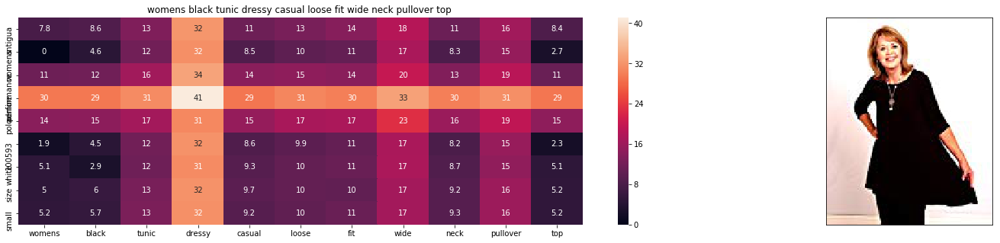

ASIN : B01KIOWXNE
Brand : Selah V Fashion
euclidean distance from input : 26.232876685994817


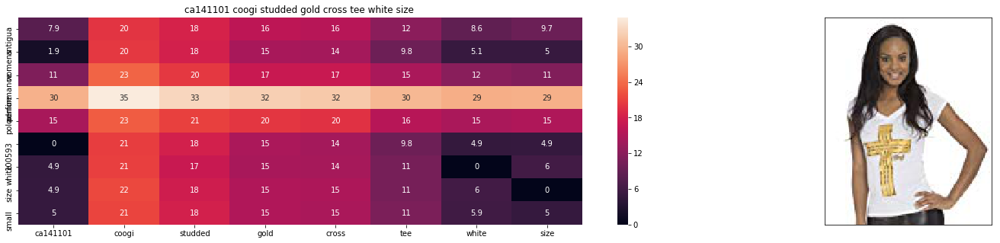

ASIN : B00KN2X2PA
Brand : COOGI
euclidean distance from input : 26.339881897063


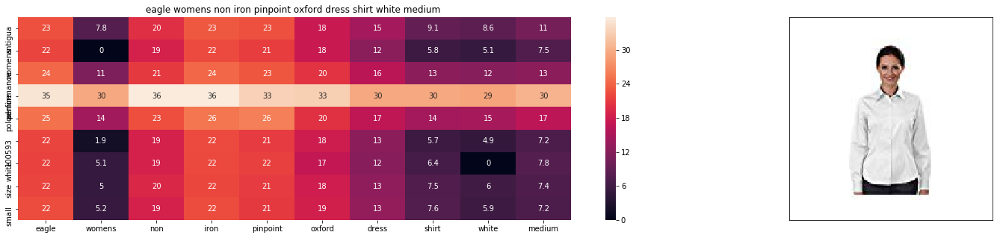

ASIN : B01DJMU18Q
Brand : Eagle
euclidean distance from input : 26.358437347502456


In [77]:
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    img_dist = pairwise_distances(img_feat, img_feat[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2+ w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(new_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(new_data['title'].loc[df_indices[0]],new_data['title'].loc[df_indices[i]], new_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',new_data['asin'].loc[df_indices[i]])
        print('Brand :',new_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(897, 5, 5,10, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Conclusion
            1. After loading the data,anayize the given data
            2. Perform necessary operations and study well about the data
            3. Load the image vectors and word2vec vectors
            4. Encode brand and color features
            6. Perform idf vectorizing on titles
            7. Compute pairwise distances with weighted (idfvectorizer+brand and color + image features)
            8. If we give more weight to brand and color, products with same brand and color is displayed in most cases
            9. If we give more weight to title, products with similar  title is displayed in most cases.
            10.If we give more weight to image feature, products with similar image is displayed in most cases.